In [1]:
# to handle datasets
import pandas as pd
import numpy as np

# to handle datetime variable
import datetime

# for plotting
import matplotlib.pyplot as plt
%matplotlib inline

# Custom function for feature extraction
from utils.util import date_variable_extraction

# to divide train and test set
from sklearn.model_selection import train_test_split

# feature scaling
from sklearn.preprocessing import StandardScaler

# from feature-engine
from feature_engine.imputation import MeanMedianImputer

# to display all the columns of the df
pd.pandas.set_option('display.max_columns', None)

#### CATEGRICAL ENCODING (EXTRACTED FROM DATE)

In [2]:
# load dataset
data = pd.read_csv(r'./../Dataset/1-raw/assessment_test_data.csv')
print(data.shape)
data.head()

(753, 101)


,date,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,feature_80,feature_81,feature_82,feature_83,feature_84,feature_85,feature_86,feature_87,feature_88,feature_89,feature_90,feature_91,feature_92,feature_93,feature_94,feature_95,feature_96,feature_97,feature_98,feature_99,units_sold
0,2020-02-01,NaN,NaN,23.0,NaN,NaN,21.0,2.1973,NaN,NaN,15.2739,NaN,NaN,NaN,NaN,NaN,0.5568,NaN,NaN,1.0,NaN,NaN,NaN,17.1452,NaN,NaN,57.0,NaN,NaN,NaN,0.6841,0.7112,NaN,NaN,41.2141,NaN,NaN,42.8634,NaN,NaN,9.0,NaN,NaN,NaN,1.2242,13.0,2.3638,29.5852,NaN,1.8323,NaN,NaN,70.0,123.8373,68.6177,29.99,NaN,NaN,NaN,NaN,NaN,5.7495,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.2151,NaN,25.3545,NaN,22.8820,NaN,NaN,NaN,NaN,-11.5191,0.7847,NaN,13.1122,39.0,67.0,NaN,NaN,5.7868,77.5917,NaN,NaN,37.0,NaN,64.0,51.2223,44.0,0.0
1,2020-02-02,NaN,NaN,27.0,NaN,NaN,27.0,1.9945,NaN,NaN,13.7223,NaN,NaN,NaN,NaN,NaN,13.6438,NaN,NaN,1.0,NaN,NaN,NaN,66.9501,NaN,NaN,52.0,NaN,NaN,NaN,1.3896,2.7310,NaN,NaN,5.7830,500590.0,NaN,18.2881,NaN,NaN,11.0,NaN,NaN,NaN,1.1977,9.0,NaN,33.9121,NaN,12.7509,NaN,NaN,70.0,22.1150,52.0004,29.99,NaN,NaN,NaN,NaN,NaN,5.0426,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.1713,NaN,14.8655,NaN,10.8485,NaN,NaN,NaN,NaN,73.4146,5.4652,NaN,12.7504,43.0,68.0,NaN,NaN,5.8770,10.8102,NaN,NaN,36.0,NaN,62.0,60.7981,56.0,0.0
2,2020-02-03,NaN,NaN,23.0,NaN,NaN,19.0,1.5184,NaN,NaN,0.5006,NaN,NaN,NaN,NaN,NaN,1.7467,NaN,NaN,1.0,NaN,NaN,NaN,65.5042,NaN,NaN,53.0,NaN,NaN,NaN,5.5175,10.2251,NaN,NaN,18.2655,500590.0,NaN,45.6468,NaN,NaN,11.0,NaN,NaN,NaN,1.0727,16.0,2.2997,10.1836,NaN,13.4936,NaN,NaN,61.0,44.5890,88.7480,29.99,NaN,NaN,NaN,NaN,NaN,52.7741,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.9234,NaN,12.6120,NaN,12.2109,NaN,NaN,NaN,NaN,39.0626,0.8892,NaN,28.1801,54.0,86.0,NaN,NaN,3.6639,12.4781,NaN,NaN,21.0,NaN,55.0,35.2005,48.0,0.0
3,2020-02-04,NaN,NaN,25.0,NaN,NaN,22.0,4.4803,NaN,NaN,1.9676,NaN,NaN,NaN,NaN,NaN,6.1486,NaN,NaN,1.0,NaN,NaN,NaN,99.3670,NaN,NaN,59.0,NaN,NaN,NaN,1.1937,4.9927,NaN,NaN,2.0493,500590.0,NaN,47.1688,NaN,NaN,7.0,NaN,NaN,NaN,NaN,12.0,26.6358,15.4114,NaN,0.8022,NaN,NaN,72.0,96.6576,39.3154,29.99,NaN,NaN,NaN,NaN,NaN,6.7933,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.1667,NaN,17.2392,NaN,10.7743,NaN,NaN,NaN,NaN,67.1190,0.9127,NaN,26.6756,68.0,70.0,NaN,NaN,6.4765,73.0898,NaN,NaN,37.0,NaN,53.0,76.3142,38.0,0.0
4,2020-02-05,NaN,NaN,28.0,NaN,NaN,17.0,2.4623,NaN,NaN,8.2844,NaN,NaN,NaN,NaN,NaN,14.8797,NaN,NaN,1.0,NaN,NaN,NaN,108.5501,NaN,NaN,69.0,NaN,NaN,NaN,1.1585,3.7804,NaN,NaN,0.2248,500590.0,NaN,31.5702,NaN,NaN,5.0,NaN,NaN,NaN,1.2443,8.0,3.7091,29.0262,NaN,NaN,NaN,NaN,56.0,120.1480,61.7043,29.99,NaN,NaN,NaN,NaN,NaN,17.4728,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.6817,NaN,26.1200,NaN,19.9312,NaN,NaN,NaN,NaN,98.1468,1.5502,NaN,43.7177,49.0,76.0,NaN,NaN,7.2720,50.5264,NaN,NaN,36.0,NaN,39.0,25.8219,30.0,0.0


In [3]:
# Extracting date features and converting them from as nominal variable to categorical vars for targeted Ordered encoding
data = date_variable_extraction(data, 'date')

data.shape, data.dtypes

C:\Users\jaspe\Documents\Projects\Turing\sales_prediction_solution\research_environment_notebooks\utils\util.py:9: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['dt_week'] = df[var].dt.week  # week of year from 1 to 52


((753, 107),
 date             datetime64[ns]
 feature_1               float64
 feature_2               float64
 feature_3               float64
 feature_4               float64
                       ...      
 dt_week                  object
 dt_month                 object
 dt_quater                object
 dt_dayofweek             object
 dt_is_weekend            object
 Length: 107, dtype: object)

In [4]:
# Separate dataset into train and test
# Setting the seed with "random state=0", to make the notebook reusable
X_train, X_test, y_train, y_test = train_test_split(
    data.drop(['date', 'units_sold'], axis=1), 
    data['units_sold'],
    test_size=0.15,
    random_state=0
)

X_train.shape, X_test.shape
# Creating train test splits to prevent overfitting

((640, 105), (113, 105))

In [5]:
# for encoding the extracted dt variales with feature-engine
from feature_engine.encoding import OrdinalEncoder

# Endocing the nomial variable (Extracted data) by ordering the labels according to the target
cat_vars = [var for var in X_train.columns if X_train[var].dtype == 'O']

ordinal_enc = OrdinalEncoder(
    # NOTE that we indicate ordered in the encoding_method, otherwise it assings numbers arbitrarily
    encoding_method='ordered',
    variables=cat_vars
)

In [6]:
ordinal_enc.fit(X_train, y_train)

OrdinalEncoder(variables=['dt_day', 'dt_week', 'dt_month', 'dt_quater',
                          'dt_dayofweek', 'dt_is_weekend'])

In [7]:
ordinal_enc.variables, ordinal_enc.variables_

(['dt_day',
  'dt_week',
  'dt_month',
  'dt_quater',
  'dt_dayofweek',
  'dt_is_weekend'],
 ['dt_day',
  'dt_week',
  'dt_month',
  'dt_quater',
  'dt_dayofweek',
  'dt_is_weekend'])

In [8]:
ordinal_enc.encoder_dict_

{'dt_day': {25: 0,
  23: 1,
  17: 2,
  22: 3,
  1: 4,
  20: 5,
  27: 6,
  18: 7,
  21: 8,
  24: 9,
  4: 10,
  2: 11,
  16: 12,
  14: 13,
  19: 14,
  28: 15,
  26: 16,
  5: 17,
  15: 18,
  30: 19,
  31: 20,
  11: 21,
  29: 22,
  13: 23,
  3: 24,
  7: 25,
  10: 26,
  12: 27,
  6: 28,
  9: 29,
  8: 30},
 'dt_week': {42: 0,
  16: 1,
  15: 2,
  17: 3,
  43: 4,
  44: 5,
  11: 6,
  18: 7,
  45: 8,
  12: 9,
  46: 10,
  47: 11,
  13: 12,
  41: 13,
  23: 14,
  7: 15,
  22: 16,
  25: 17,
  8: 18,
  10: 19,
  19: 20,
  26: 21,
  6: 22,
  20: 23,
  9: 24,
  21: 25,
  4: 26,
  14: 27,
  5: 28,
  1: 29,
  2: 30,
  3: 31,
  52: 32,
  51: 33,
  29: 34,
  50: 35,
  27: 36,
  53: 37,
  40: 38,
  28: 39,
  24: 40,
  39: 41,
  32: 42,
  48: 43,
  33: 44,
  34: 45,
  31: 46,
  35: 47,
  30: 48,
  49: 49,
  36: 50,
  37: 51,
  38: 52},
 'dt_month': {4: 0,
  10: 1,
  3: 2,
  11: 3,
  2: 4,
  6: 5,
  5: 6,
  1: 7,
  12: 8,
  7: 9,
  8: 10,
  9: 11},
 'dt_quater': {2: 0, 1: 1, 4: 2, 3: 3},
 'dt_dayofweek': {'Th

In [9]:
X_train = ordinal_enc.transform(X_train)
X_test = ordinal_enc.transform(X_test)

# Visualizing outcome
X_train[[var for var in X_train.columns if 'dt' in var]].head()

,dt_day,dt_week,dt_month,dt_quater,dt_dayofweek,dt_is_weekend
682,13,35,8,2,1,0
527,27,39,9,3,4,0
577,20,47,10,3,1,0
367,11,28,4,1,1,0
249,25,13,1,2,2,0


Note: Since for the data analysis phase we observed that 85% of our features as already discrete (this means they contain that 20 or less unique values), I will be skipping the discretization step. (This is also due to the 8hr time constraint for this assesment)

In [10]:
X_train.dtypes

feature_1        float64
feature_2        float64
feature_3        float64
feature_4        float64
feature_5        float64
                  ...   
dt_week            int64
dt_month           int64
dt_quater          int64
dt_dayofweek       int64
dt_is_weekend      int64
Length: 105, dtype: object

#### MISSING DATA IMPUTATION

In [11]:
# identify the numerical variables
num_vars = [var for var in X_train.columns if X_train[var].dtype != 'O']

# number of numerical variables
len(num_vars)

105

In [12]:
# make a list with the numerical variables that contain missing values
num_vars_with_na = [
    var for var in num_vars
    if X_train[var].isnull().sum() > 0
]

len(num_vars_with_na)

96

In [13]:
# Feature-engine captures the numerical variables automatically
# To perform median imputation, we specify the  imputation strategy
imputer = MeanMedianImputer(
    imputation_method='median',
)
# we fit the imputer
imputer.fit(X_train)
# here we hold the median assigned to each variable

MeanMedianImputer()

In [14]:
imputer.variables_

['feature_1',
 'feature_2',
 'feature_3',
 'feature_4',
 'feature_5',
 'feature_6',
 'feature_7',
 'feature_8',
 'feature_9',
 'feature_10',
 'feature_11',
 'feature_12',
 'feature_13',
 'feature_14',
 'feature_15',
 'feature_16',
 'feature_17',
 'feature_18',
 'feature_19',
 'feature_20',
 'feature_21',
 'feature_22',
 'feature_23',
 'feature_24',
 'feature_25',
 'feature_26',
 'feature_27',
 'feature_28',
 'feature_29',
 'feature_30',
 'feature_31',
 'feature_32',
 'feature_33',
 'feature_34',
 'feature_35',
 'feature_36',
 'feature_37',
 'feature_38',
 'feature_39',
 'feature_40',
 'feature_41',
 'feature_42',
 'feature_43',
 'feature_44',
 'feature_45',
 'feature_46',
 'feature_47',
 'feature_48',
 'feature_49',
 'feature_50',
 'feature_51',
 'feature_52',
 'feature_53',
 'feature_54',
 'feature_55',
 'feature_56',
 'feature_57',
 'feature_58',
 'feature_59',
 'feature_60',
 'feature_61',
 'feature_62',
 'feature_63',
 'feature_64',
 'feature_65',
 'feature_66',
 'feature_67',
 'fe

In [15]:
imputer.imputer_dict_

{'feature_1': 1.0417,
 'feature_2': 29.99,
 'feature_3': 26.0,
 'feature_4': 15.5714,
 'feature_5': 16.0,
 'feature_6': 20.0,
 'feature_7': 1.6561,
 'feature_8': 14.5714,
 'feature_9': 29.99,
 'feature_10': 3.694,
 'feature_11': 73933.1271,
 'feature_12': 15.1667,
 'feature_13': 53021.7007,
 'feature_14': 29.99,
 'feature_15': 1.0,
 'feature_16': 3.83345,
 'feature_17': 29.99,
 'feature_18': 1.0,
 'feature_19': 1.0,
 'feature_20': 29.99,
 'feature_21': 29.99,
 'feature_22': 53484.2631,
 'feature_23': 74.2706,
 'feature_24': 1.0,
 'feature_25': 29.99,
 'feature_26': 56.0,
 'feature_27': 1.0,
 'feature_28': 55111.2738,
 'feature_29': 29.99,
 'feature_30': 2.2656,
 'feature_31': 3.5393,
 'feature_32': 15.2857,
 'feature_33': 15.2857,
 'feature_34': 3.20885,
 'feature_35': 47856.0,
 'feature_36': 14.64285,
 'feature_37': 36.3748,
 'feature_38': 1.0,
 'feature_39': 1.0417,
 'feature_40': 8.0,
 'feature_41': 67159.6106,
 'feature_42': 54527.90579999999,
 'feature_43': 15.0,
 'feature_44': 1.

In [16]:
X_train = imputer.transform(X_train)
X_test = imputer.transform(X_test)

X_train.head()

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,feature_80,feature_81,feature_82,feature_83,feature_84,feature_85,feature_86,feature_87,feature_88,feature_89,feature_90,feature_91,feature_92,feature_93,feature_94,feature_95,feature_96,feature_97,feature_98,feature_99,dt_day,dt_week,dt_month,dt_quater,dt_dayofweek,dt_is_weekend
682,1.0190,30.99,17.0,24.2857,10.5714,22.0,1.4024,27.7143,30.99,1.3008,163041.7771,6.9000,24556.8952,30.99,1.4150,117.9431,30.9900,2.0,2.0,30.99,30.99,30461.2500,96.9325,1.0000,30.99,56.0,2.4246,219519.2857,30.99,2.2656,1.6325,18.4286,21.0000,4.1884,53777.7143,25.2857,89.5637,2.0,1.9778,9.0,70701.6873,32728.1286,8.8571,1.0278,15.0,15.6494,16.8583,47935.6071,3.7949,20.8000,28.7143,64.0,124.1719,92.5569,30.99,24.7143,115874.6429,30.99,0.0000,2.0,10.3943,30.99,2.1071,3.0,30.99,2.2857,300398.7381,30.99,14.4286,1.0000,95322.8912,1.8296,48154.9357,10.8227,40848.8231,-1.5939,30.99,16.6817,30.99,92362.4881,1.0397,30.99,37.8107,9.7819,1.0000,26.7791,51.0,71.0,54301.0306,27858.3000,8.8764,56.0566,1.7936,27.5667,45.0,1.00,47.0,46.6974,42.0,13,35,8,2,1,0
527,1.0000,29.99,27.0,1.2857,20.4286,24.0,2.1176,0.0000,29.99,3.6940,339461.3183,1.0667,339199.5000,29.99,1.0000,7.2083,29.9900,1.0,2.0,29.99,29.99,298264.2381,57.5307,1.0000,29.99,62.0,1.0000,276071.4405,29.99,5.5703,46.7960,0.0000,25.4286,9.9997,26162.0000,2.5714,33.6762,1.0,1.0000,11.0,154320.0528,224471.9286,0.0000,0.8562,9.0,4.7817,48.0551,160535.2143,0.7044,14.7333,16.0000,63.0,92.4561,51.7030,29.99,12.4286,453958.7500,29.99,3.1429,1.0,1.0994,29.99,1.0000,2.0,29.99,0.0000,293453.8226,29.99,13.8571,1.0000,187129.1905,1.1905,542650.7679,0.4411,57804.3571,11.7850,29.99,19.0664,29.99,127922.9048,1.0000,29.99,62.7217,1.1240,1.0000,27.8554,49.0,76.0,29242.7738,230625.9893,5.0742,73.2680,1.0444,6.4000,33.0,1.00,50.0,46.5672,35.0,27,39,9,3,4,0
577,1.4150,29.99,42.0,20.8571,32.1429,21.0,0.9567,2.4286,29.99,29.2722,28319.7072,27.6000,555656.6845,29.99,1.0000,1.6475,30.9043,1.0,1.0,30.67,30.99,47786.4286,108.1435,1.3333,29.99,61.0,1.1333,29171.3452,29.99,3.2463,25.5162,27.5714,26.5714,1.4778,22931.6000,19.0000,26.8346,1.0,1.0000,7.0,29184.0900,238977.2381,28.2857,1.1016,9.0,11.2380,23.5567,28719.6643,8.8640,27.1667,30.4286,56.0,37.4248,47.5099,30.99,0.2857,25336.6143,29.99,24.7143,1.0,2.0640,29.99,1.0952,2.0,29.99,30.2857,26452.5119,30.99,20.7143,1.4667,33240.6286,1.0000,26456.7262,8.6386,107237.9286,33.5698,29.99,19.2586,29.99,26428.4595,1.9524,29.99,-13.3492,1.6358,1.5143,-1.7018,34.0,54.0,29111.3952,311388.1111,2.9565,47.7598,1.3422,6.6667,30.0,1.75,40.0,33.8229,38.0,20,47,10,3,1,0
367,1.3667,29.99,29.0,13.0000,14.5714,27.0,1.5478,0.0000,29.99,0.9619,51408.2244,19.6000,630546.9286,29.99,1.1786,14.0662,29.9900,1.0,2.0,29.99,29.99,682653.5000,-2.5516,1.0000,29.99,63.0,1.0000,49561.0000,29.99,3.2064,6.2774,20.1429,18.8571,11.3902,27994.0000,0.0000,56.5169,1.0,1.0417,10.0,52156.8744,280918.7857,13.4286,1.3073,22.0,10.9771,38.8791,61520.5119,3.3021,15.1000,12.2857,60.0,76.5214,102.4437,29.99,23.2857,47692.2500,29.99,21.0000,1.0,26.4323,29.99,1.5714,3.0,29.99,15.2857,67719.0595,29.99,30.8571,2.0000,50686.0714,2.0000,42200.6286,5.6237,42021.2857,18.1591,29.99,15.5239,29.99,4970

In [17]:
X_train.isnull().sum()

feature_1        0
feature_2        0
feature_3        0
feature_4        0
feature_5        0
                ..
dt_week          0
dt_month         0
dt_quater        0
dt_dayofweek     0
dt_is_weekend    0
Length: 105, dtype: int64

#### VARIABLE TRANSFORMATION

In [18]:
# Variable transformation for numerical variables to give a guasian like distrbution
import scipy.stats as stats
import feature_engine.transformation as vt
# from feature_engine import variable_transformers as vt

# I will be using Yeo Johnson transformer as it carters for both positive and negative values
# All variables will be transfromed and scaled expect the "date" and "units_sold" variables

In [19]:
train_vars = [var for var in X_train.columns]
len(train_vars)

105

In [20]:
# plot the histograms to have a quick look at the variable distribution
# histogram and Q-Q plots

# Plotting the distribution of the variables/features in the dataset helps to visualize the effect of the transformation
def diagnostic_plots(df):
    for var in df.columns:
         if var != 'date':
            # function to plot a histogram and a Q-Q plot
            # side by side, for a certain variable
            plt.figure(figsize=(15,6))
            plt.subplot(1, 2, 1)
            df[var].hist()

            plt.subplot(1, 2, 2)
            stats.probplot(df[var], dist="norm", plot=plt)
            plt.show()

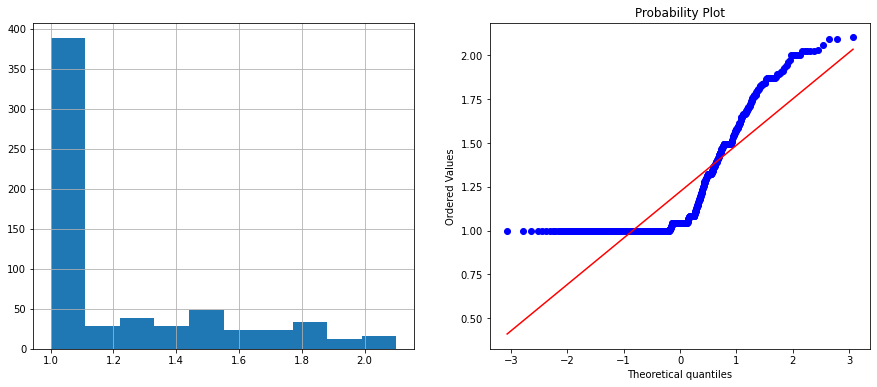

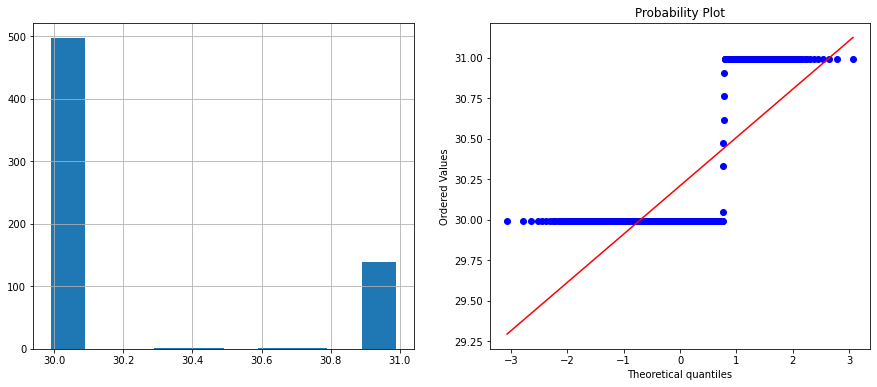

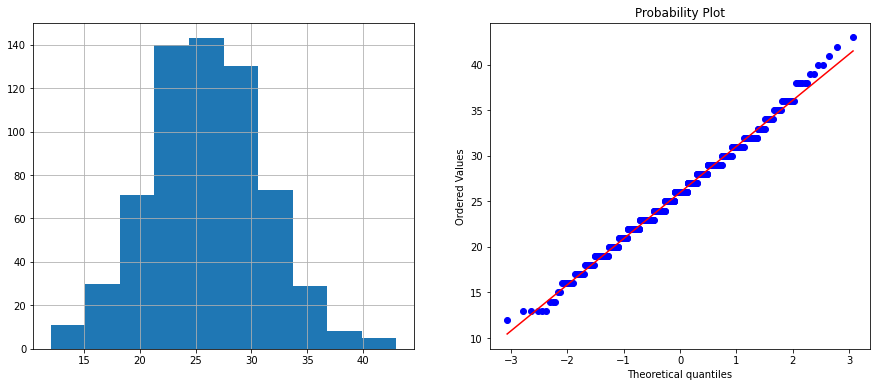

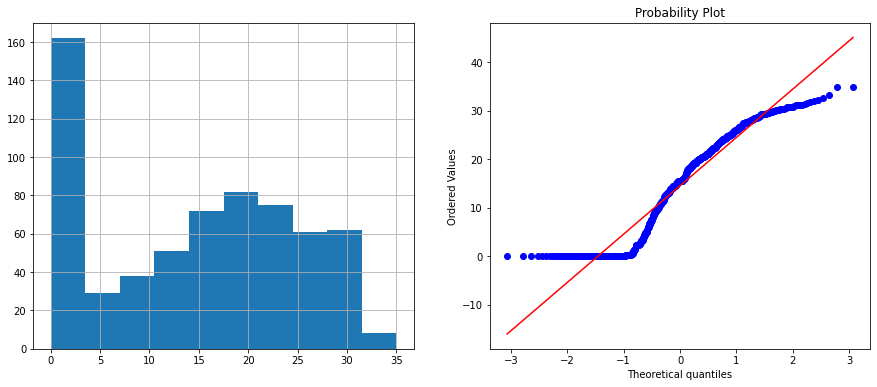

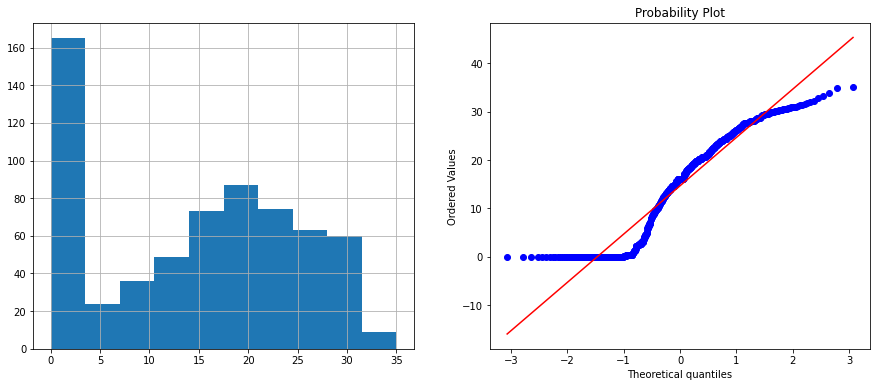

...

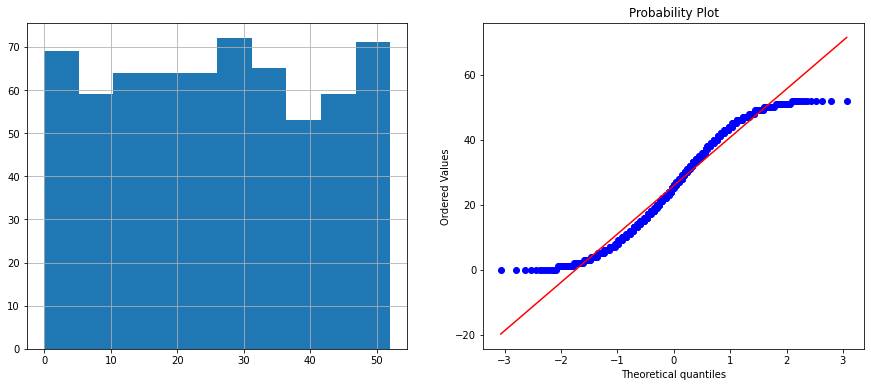

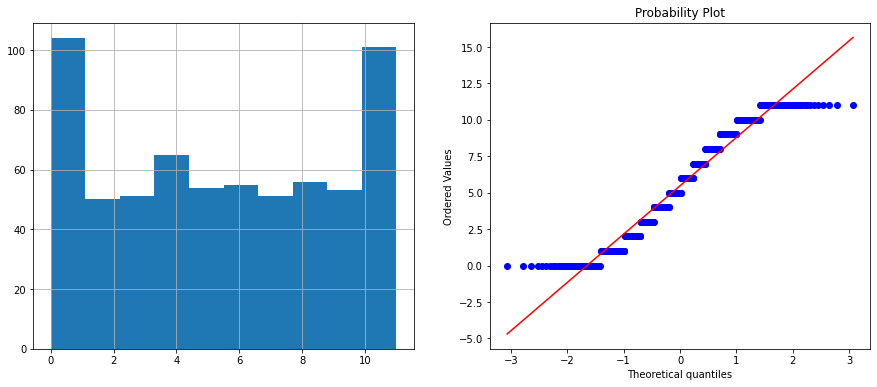

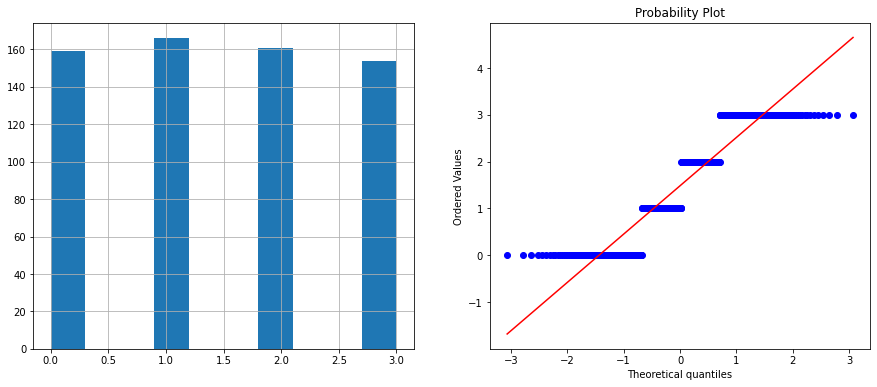

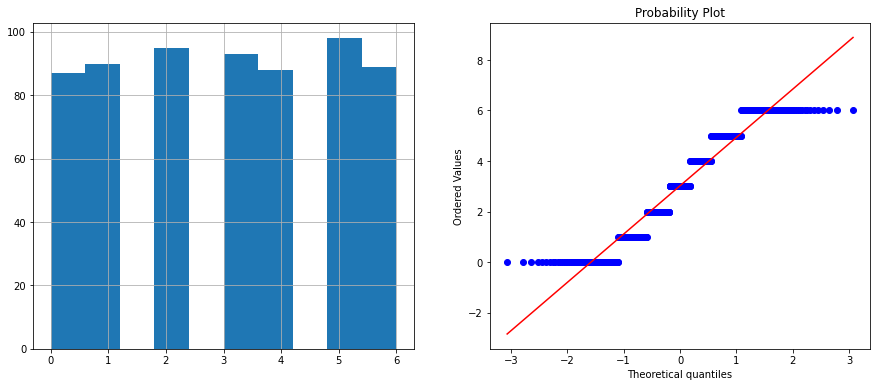

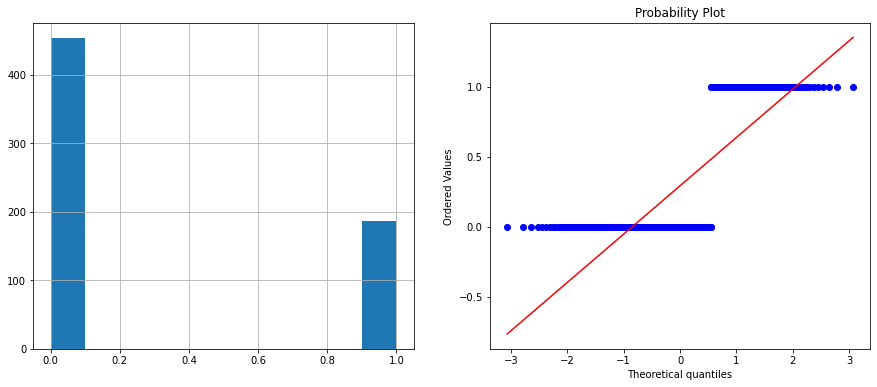

In [21]:
diagnostic_plots(X_train[train_vars])

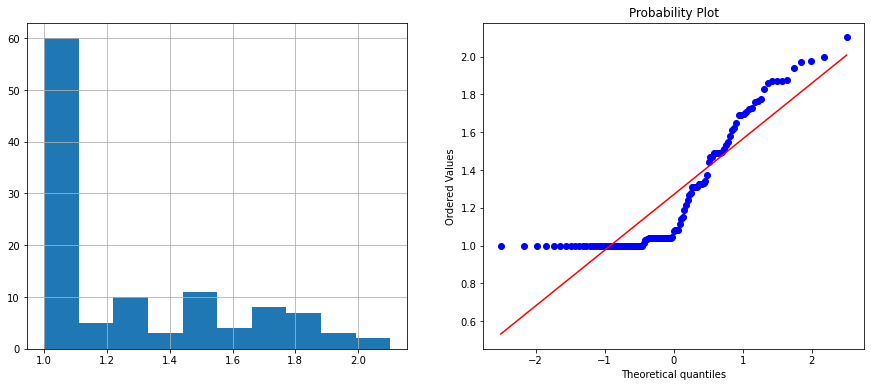

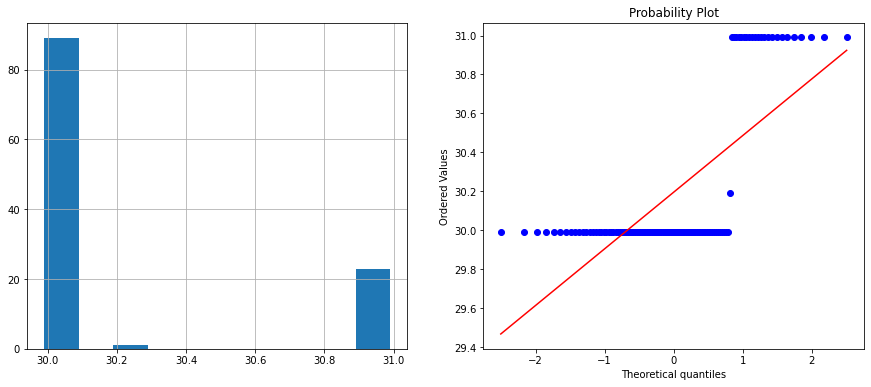

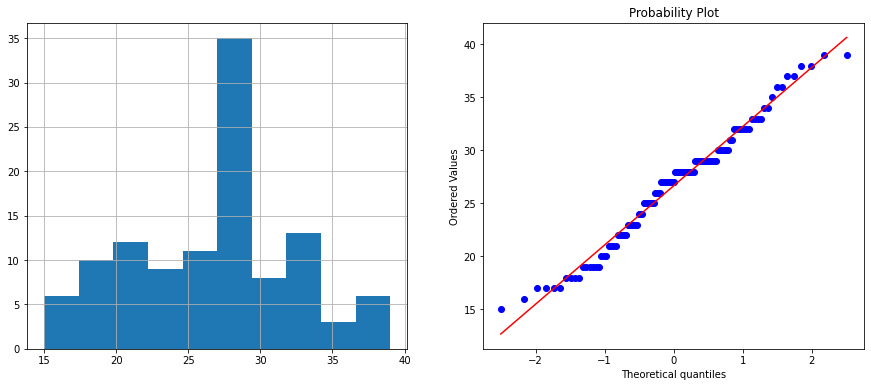

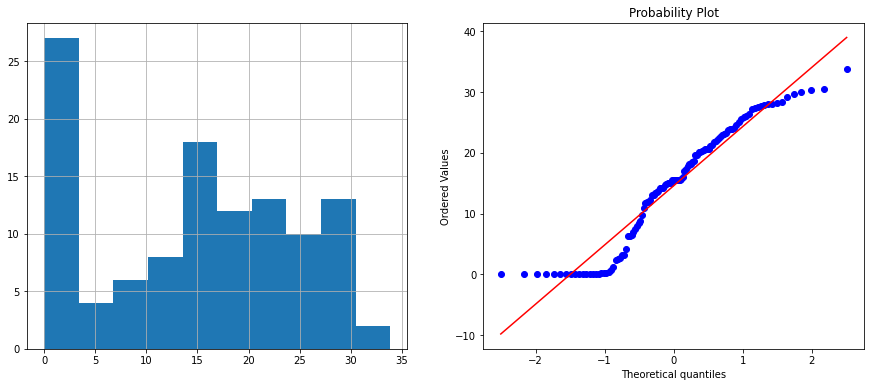

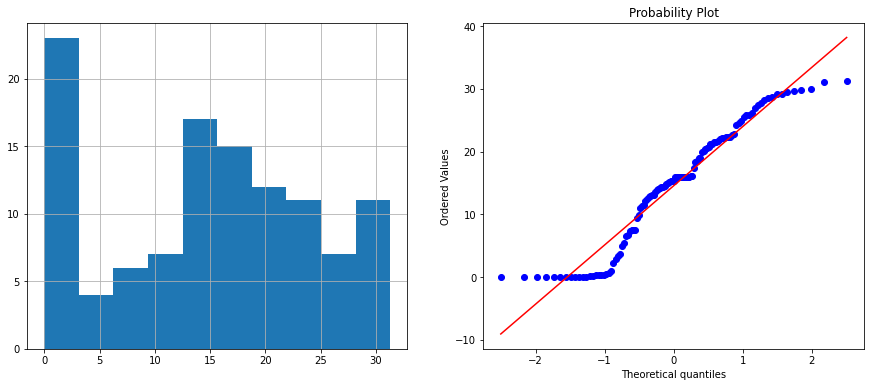

...

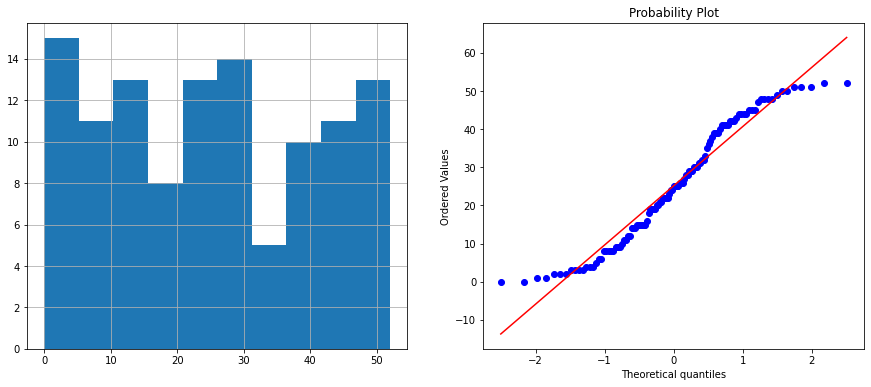

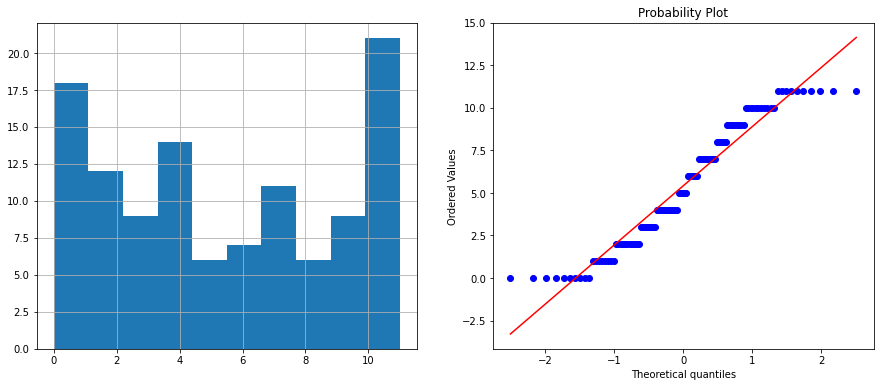

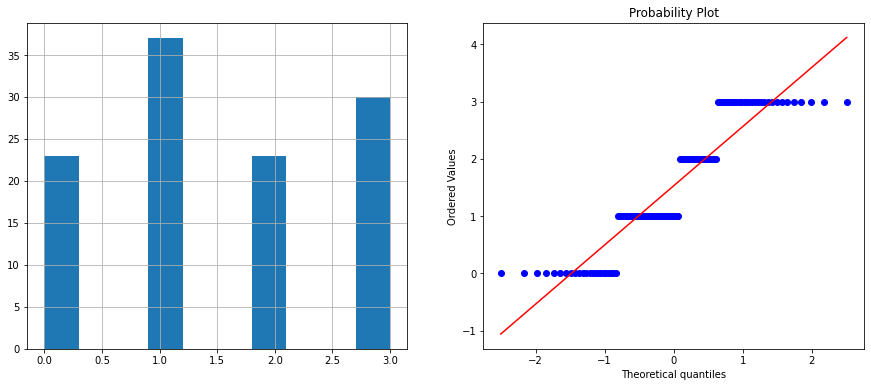

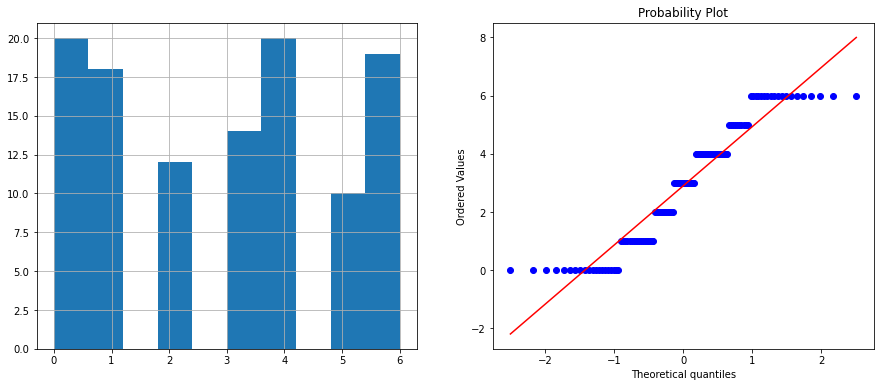

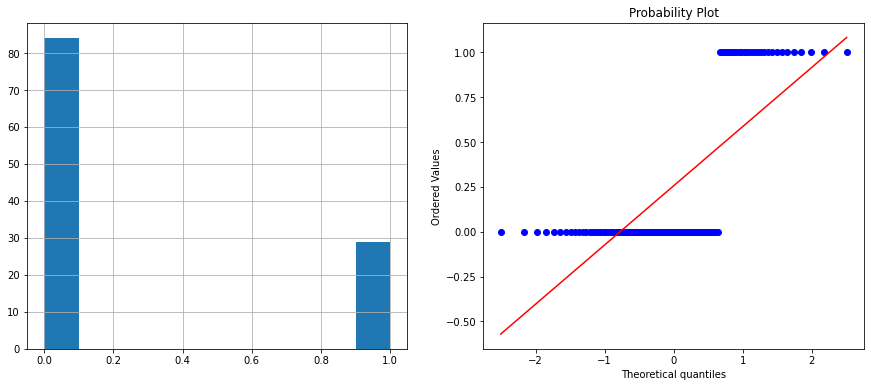

In [22]:
diagnostic_plots(X_test[train_vars])

In [23]:
yjt = vt.YeoJohnsonTransformer(variables = train_vars)
yjt.fit(X_train[train_vars])
# these are the exponents for the Yeo-Johnson transformation
# yjt.lambda_dict_

C:\Users\jaspe\anaconda3\envs\sales_predicition\lib\site-packages\scipy\stats\morestats.py:1476: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(trans.var(axis=0))
C:\Users\jaspe\anaconda3\envs\sales_predicition\lib\site-packages\scipy\optimize\optimize.py:2117: RuntimeWarning: invalid value encountered in double_scalars
  p = (x - v) * tmp2 - (x - w) * tmp1
C:\Users\jaspe\anaconda3\envs\sales_predicition\lib\site-packages\scipy\optimize\optimize.py:2118: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = 2.0 * (tmp2 - tmp1)
C:\Users\jaspe\anaconda3\envs\sales_predicition\lib\site-packages\scipy\optimize\optimize.py:2116: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)
C:\Users\jaspe\anaconda3\envs\sales_predicition\lib\site-packages\scipy\optimize\optimize.py:2115: RuntimeWarning: invalid value encountered in double_scalars
  tmp1 = (x - w) * (fx - fv)
C:\Users\jaspe\anaconda3\envs\sales_p

YeoJohnsonTransformer(variables=['feature_1', 'feature_2', 'feature_3',
                                 'feature_4', 'feature_5', 'feature_6',
                                 'feature_7', 'feature_8', 'feature_9',
                                 'feature_10', 'feature_11', 'feature_12',
                                 'feature_13', 'feature_14', 'feature_15',
                                 'feature_16', 'feature_17', 'feature_18',
                                 'feature_19', 'feature_20', 'feature_21',
                                 'feature_22', 'feature_23', 'feature_24',
                                 'feature_25', 'feature_26', 'feature_27',
                                 'feature_28', 'feature_29', 'feature_30', ...])

In [24]:
yjt.variables_

['feature_1',
 'feature_2',
 'feature_3',
 'feature_4',
 'feature_5',
 'feature_6',
 'feature_7',
 'feature_8',
 'feature_9',
 'feature_10',
 'feature_11',
 'feature_12',
 'feature_13',
 'feature_14',
 'feature_15',
 'feature_16',
 'feature_17',
 'feature_18',
 'feature_19',
 'feature_20',
 'feature_21',
 'feature_22',
 'feature_23',
 'feature_24',
 'feature_25',
 'feature_26',
 'feature_27',
 'feature_28',
 'feature_29',
 'feature_30',
 'feature_31',
 'feature_32',
 'feature_33',
 'feature_34',
 'feature_35',
 'feature_36',
 'feature_37',
 'feature_38',
 'feature_39',
 'feature_40',
 'feature_41',
 'feature_42',
 'feature_43',
 'feature_44',
 'feature_45',
 'feature_46',
 'feature_47',
 'feature_48',
 'feature_49',
 'feature_50',
 'feature_51',
 'feature_52',
 'feature_53',
 'feature_54',
 'feature_55',
 'feature_56',
 'feature_57',
 'feature_58',
 'feature_59',
 'feature_60',
 'feature_61',
 'feature_62',
 'feature_63',
 'feature_64',
 'feature_65',
 'feature_66',
 'feature_67',
 'fe

In [25]:
yjt.lambda_dict_

{'feature_1': -7.005594134019263,
 'feature_2': -42.33177503067419,
 'feature_3': 0.8239419084527129,
 'feature_4': 0.6362225236717265,
 'feature_5': 0.6470924842691075,
 'feature_6': 0.5517293961410553,
 'feature_7': -0.5740018383082744,
 'feature_8': 0.6395076076523779,
 'feature_9': -8.666062744646577,
 'feature_10': -0.3032971087558478,
 'feature_11': -10.386376762190768,
 'feature_12': 0.8126473840951971,
 'feature_13': -10.386376762190768,
 'feature_14': -40.783464618508276,
 'feature_15': -9.708810728171105,
 'feature_16': -0.3183817788897511,
 'feature_17': -17.658223476651983,
 'feature_18': -11.028959387705559,
 'feature_19': -8.200237821485217,
 'feature_20': -16.056517758569434,
 'feature_21': -98.59368767034749,
 'feature_22': -10.386376762190768,
 'feature_23': 1.0177755122903205,
 'feature_24': -9.05717687083423,
 'feature_25': -55.23256499892924,
 'feature_26': 0.611512799786684,
 'feature_27': -8.300117711157737,
 'feature_28': -10.386376762190768,
 'feature_29': -175.

In [26]:
X_train[train_vars] = yjt.transform(X_train[train_vars])
X_test[train_vars] = yjt.transform(X_test[train_vars])

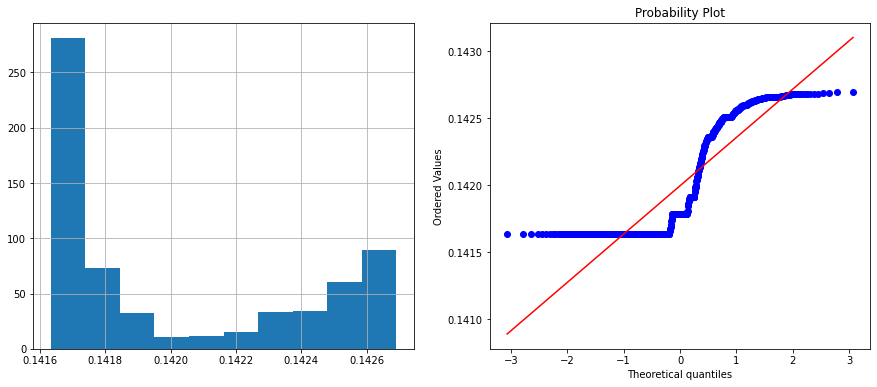

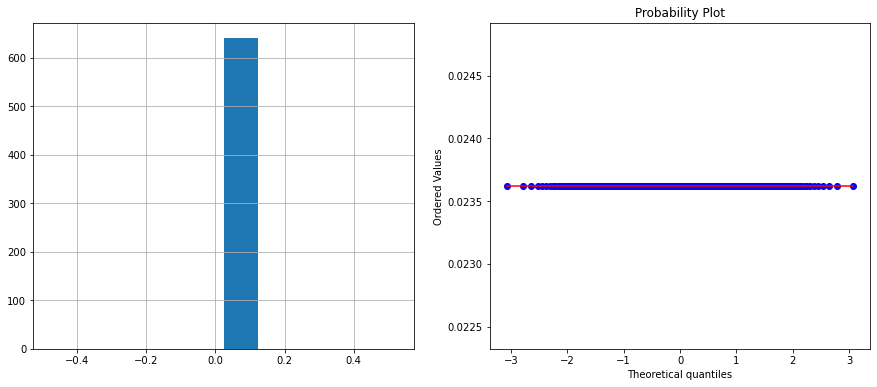

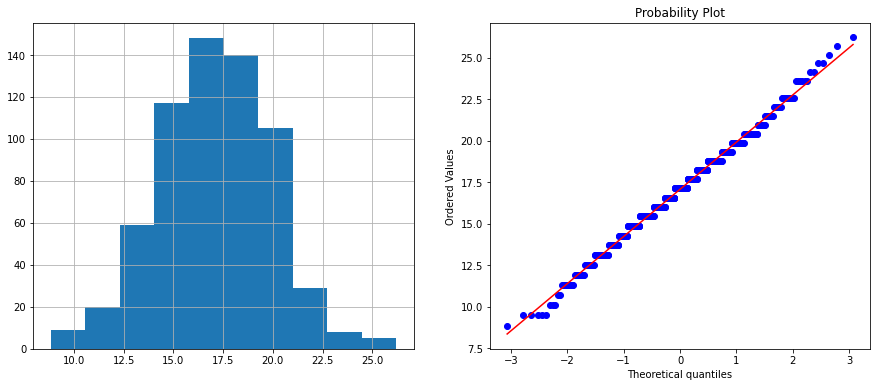

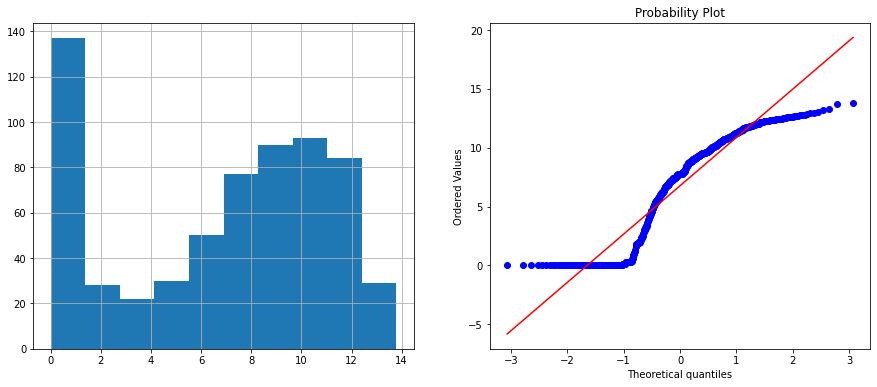

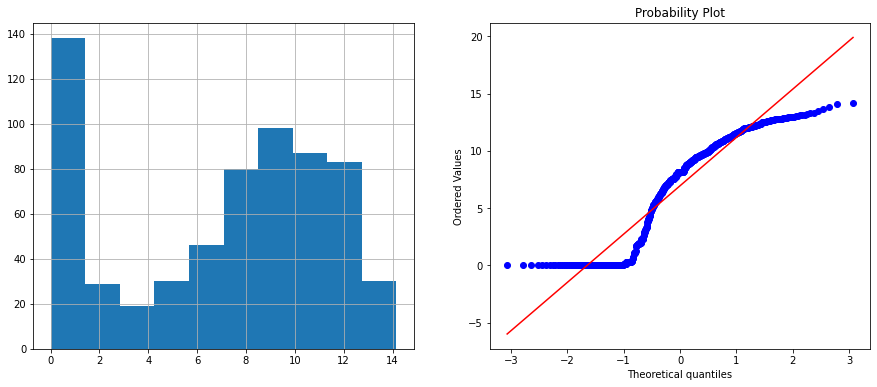

...

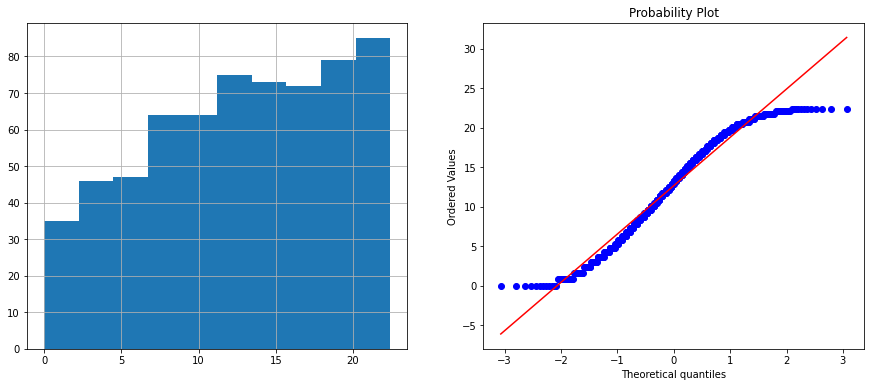

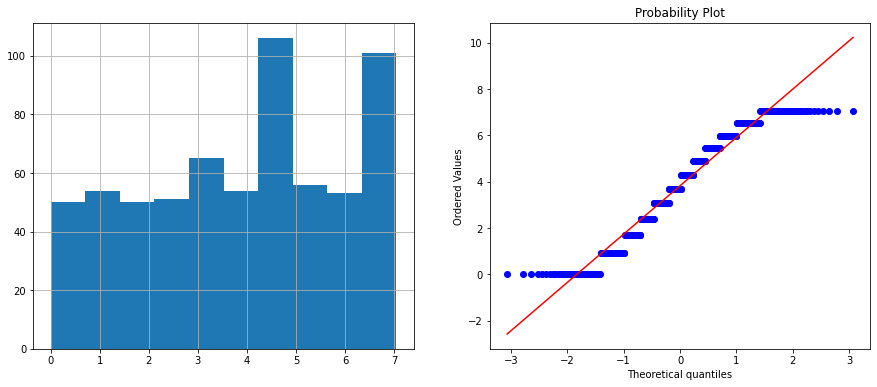

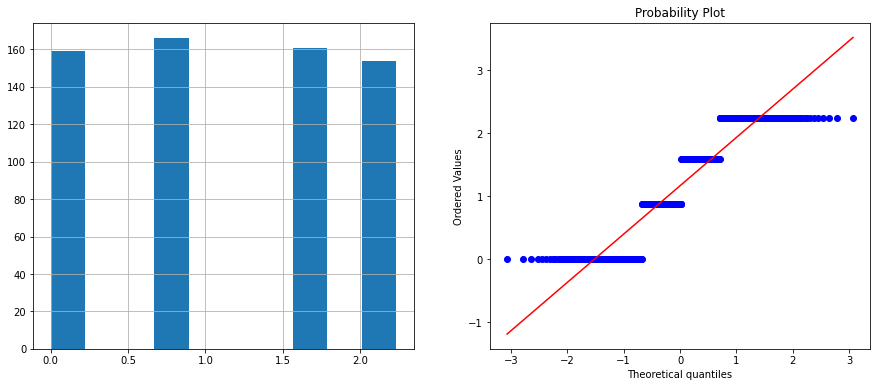

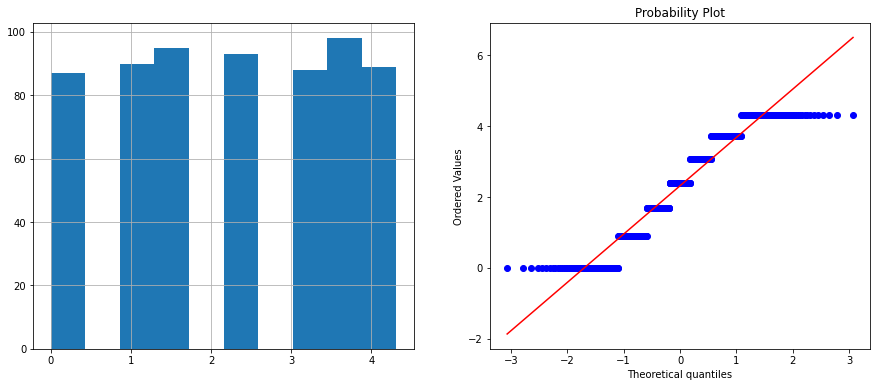

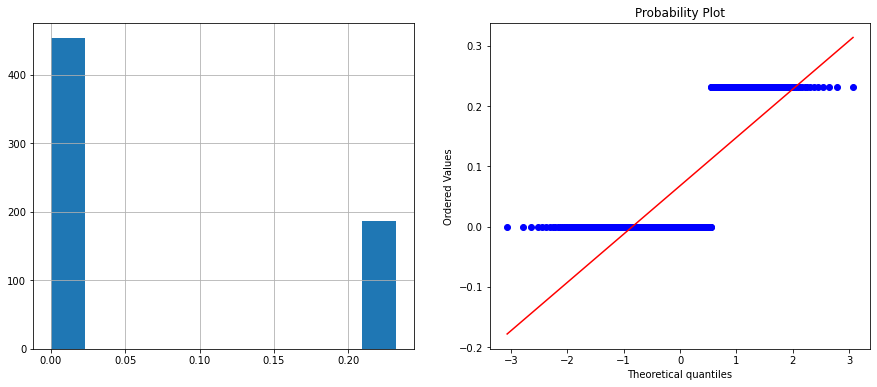

In [27]:
diagnostic_plots(X_train[train_vars])

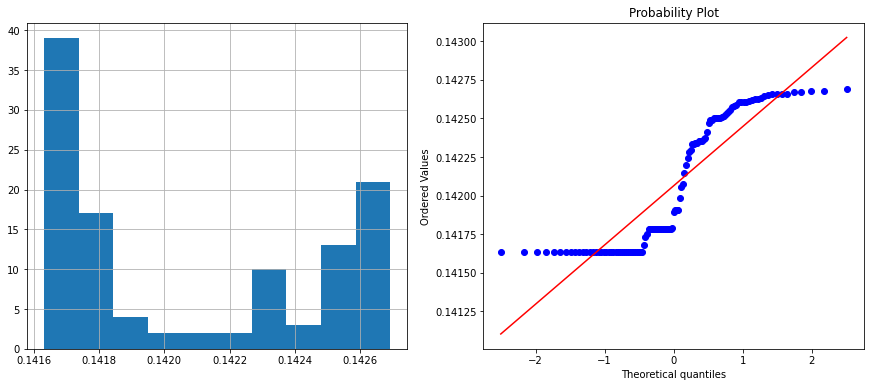

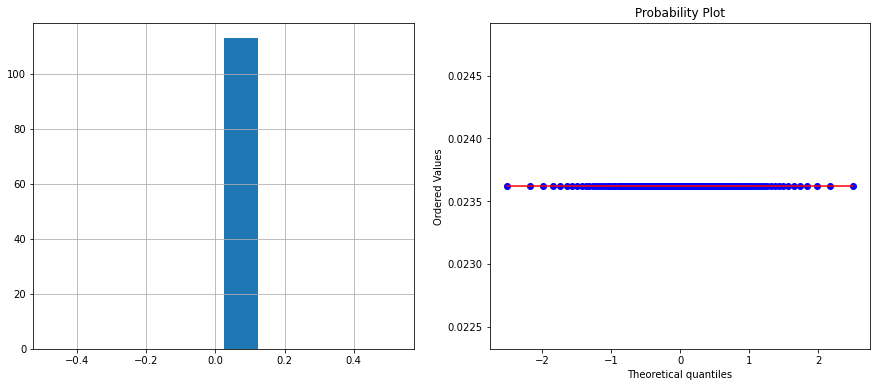

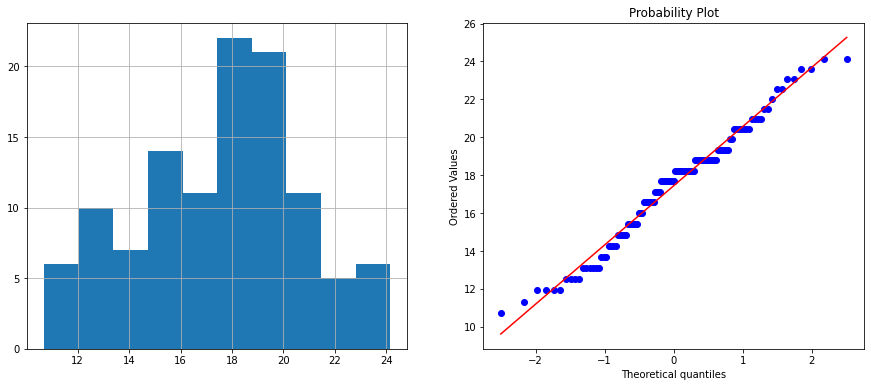

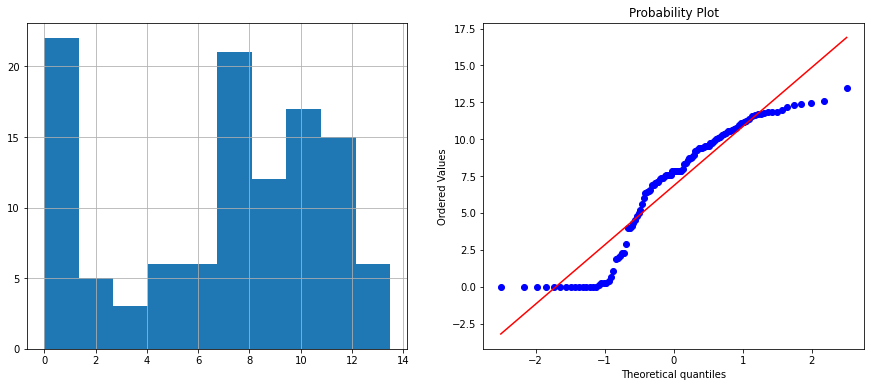

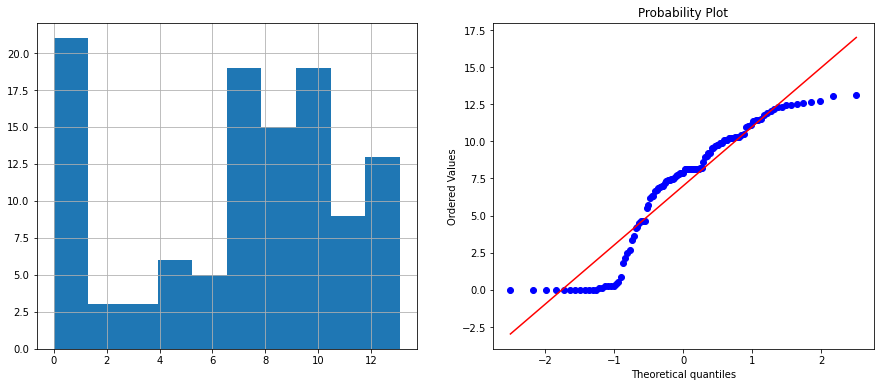

...

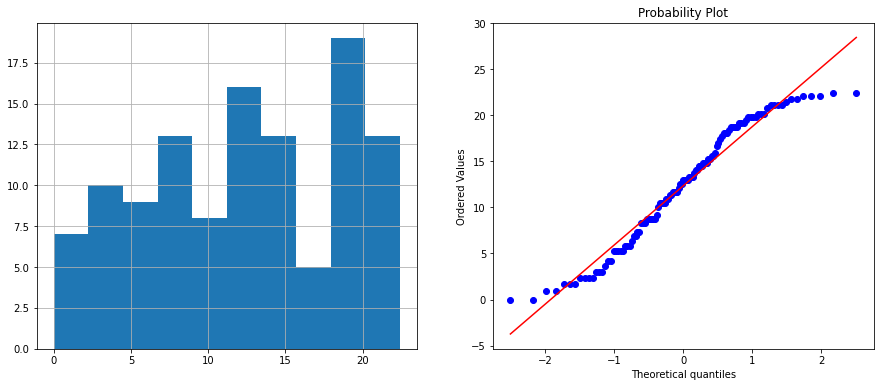

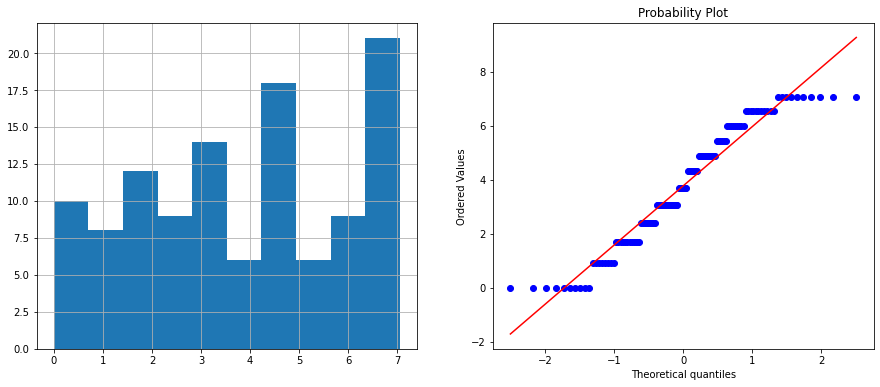

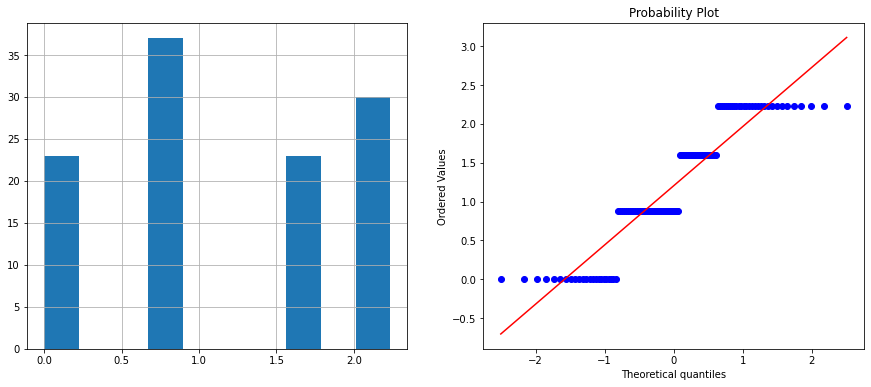

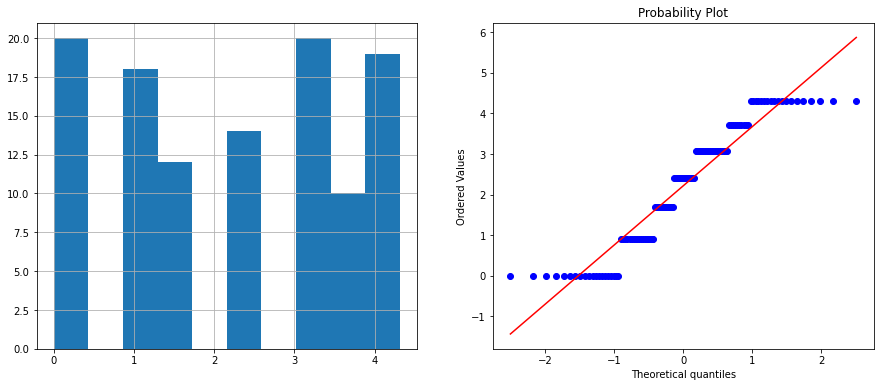

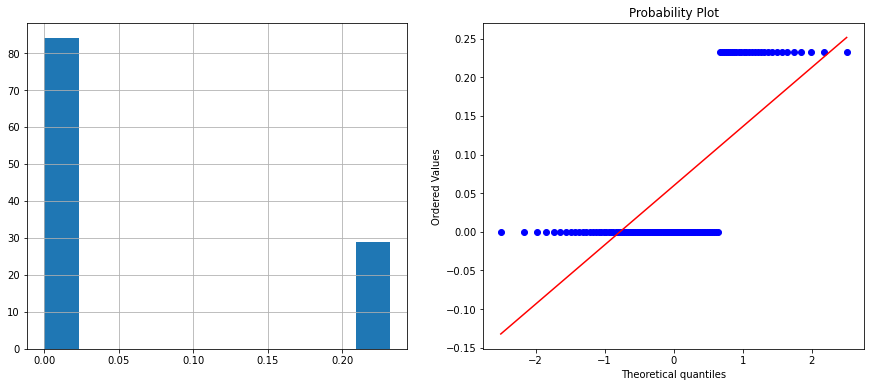

In [28]:
diagnostic_plots(X_test[train_vars])

In [29]:
X_train.head()

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,feature_80,feature_81,feature_82,feature_83,feature_84,feature_85,feature_86,feature_87,feature_88,feature_89,feature_90,feature_91,feature_92,feature_93,feature_94,feature_95,feature_96,feature_97,feature_98,feature_99,dt_day,dt_week,dt_month,dt_quater,dt_dayofweek,dt_is_weekend
682,0.141703,0.023623,11.919657,10.700683,5.990657,8.410536,0.688749,11.821322,0.115393,0.736301,0.09628,5.369579,0.09628,0.02452,0.102979,2.454919,0.056631,0.090670,0.121933,0.06228,0.010143,0.09628,103.408833,0.110202,0.018105,17.743847,0.120476,0.09628,0.005686,0.917894,0.830463,8.647472,9.767889,1.273562,0.09628,11.056719,75.519290,0.097812,0.120528,5.198008,0.09628,0.09628,5.015613,0.625045,8.803536,1.973786,16.596013,0.09628,1.241390,15.726320,12.627891,86.076140,141.493612,91.930245,0.03296,10.414102,0.09628,0.007016,0.000000,0.100434,1.722738,0.00427,0.126982,1.840137,0.058248,1.757540,0.09628,0.00836,7.178084,0.114023,0.09628,0.130063,0.09628,1.840003,0.09628,-1.643022,0.013474,15.562442,0.008754,0.09628,0.118546,0.029931,34.201757,1.646495,0.110830,25.486944,7.255251,12.695894,0.09628,0.09628,8.341694,42.390992,0.169037,17.632870,6.294778,0.110656,10.790088,55.889965,16.024196,7.431828,16.661122,5.452139,1.595345,0.903033,-0.0
527,0.141632,0.023623,17.687008,1.087766,9.682815,8.891822,0.835101,0.000000,0.115393,1.234309,0.09628,0.989220,0.09628,0.02452,0.102876,1.534052,0.056631,0.090627,0.121933,0.06228,0.010143,0.09628,60.840151,0.110202,0.018105,18.966941,0.120098,0.09628,0.005686,1.270433,2.201226,0.000000,11.182453,1.662809,0.09628,1.963955,29.656405,0.097731,0.120158,6.025993,0.09628,0.09628,0.000000,0.555197,5.883064,1.399135,46.976060,0.09628,0.491452,11.547306,8.279209,84.617564,104.356758,51.406095,0.03296,6.436144,0.09628,0.007016,2.266183,0.100335,0.664407,0.00427,0.126458,1.372291,0.058248,0.000000,0.09628,0.00836,6.974889,0.114023,0.09628,0.129793,0.09628,0.349126,0.09628,10.703974,0.013474,17.719857,0.008754,0.09628,0.118493,0.029931,55.781238,0.666799,0.110830,26.492797,7.136520,13.145896,0.09628,0.09628,4.843379,54.173643,0.166942,5.044118,5.560482,0.110656,11.158306,55.725448,14.119078,12.829405,18.070850,5.998380,2.234670,3.072293,-0.0
577,0.142447,0.023623,25.700835,9.614096,13.343673,8.162862,0.557065,1.874770,0.115393,2.125076,0.09628,17.545749,0.09628,0.02452,0.102876,0.837169,0.056631,0.090627,0.121533,0.06228,0.010143,0.09628,115.583584,0.110358,0.018105,18.766343,0.120256,0.09628,0.005686,1.063445,2.016445,11.448141,11.533286,0.785299,0.09628,9.036050,23.860497,0.097731,0.120158,4.306243,0.09628,0.09628,11.348974,0.652666,5.883064,1.823027,23.140065,0.09628,1.638847,19.954055,13.159544,74.467038,41.061405,47.244041,0.03296,0.271862,0.09628,0.007016,10.290759,0.100335,0.949933,0.00427,0.126624,1.372291,0.058248,11.982241,0.09628,0.00836,9.251119,0.114246,0.09628,0.129475,0.09628,1.727368,0.09628,29.056291,0.013474,17.893343,0.008754,0.09628,0.118828,0.029931,-14.294356,0.829211,0.111019,-1.721859,6.114919,11.018950,0.09628,0.09628,2.858332,36.599932,0.168316,5.227747,5.346567,0.110858,9.879628,39.766668,14.950304,10.275679,20.775155,6.530114,2.234670,0.903033,-0.0
367,0.14

In [30]:
len(X_train.columns), len(train_vars)

(105, 105)

#### OUTLIER HANDLING

Censoring/Capping will we used to handle Outliers primaryly because we do not want to remove data.
A risk to not is that capping may affect the reations among the variables

In [31]:
from feature_engine.outliers import Winsorizer

import seaborn as sns

In [32]:
def diagnostic_plots(df):
    # function takes a dataframe (df) and
    # the variable of interest as arguments
    
    for var in df.columns:
         if var != 'date':
            plt.figure(figsize=(16, 4))

            # histogram
            plt.subplot(1, 3, 1)
            sns.histplot(df[var], bins=30)
            plt.title('Histogram')

            # Q-Q plot
            plt.subplot(1, 3, 2)
            stats.probplot(df[var], dist="norm", plot=plt)
            plt.ylabel('Variable quantiles')

            # boxplot
            plt.subplot(1, 3, 3)
            sns.boxplot(y=df[var])
            plt.title('Boxplot')

            plt.show()

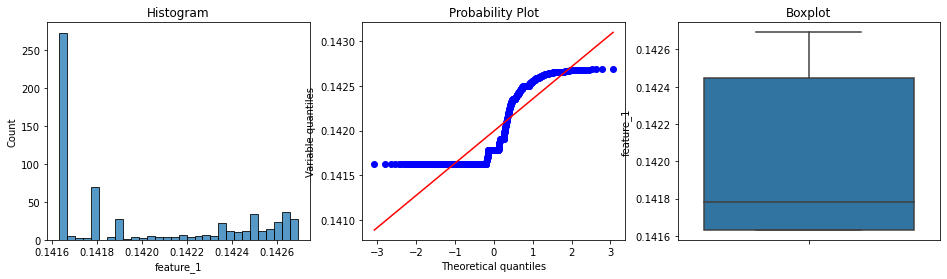

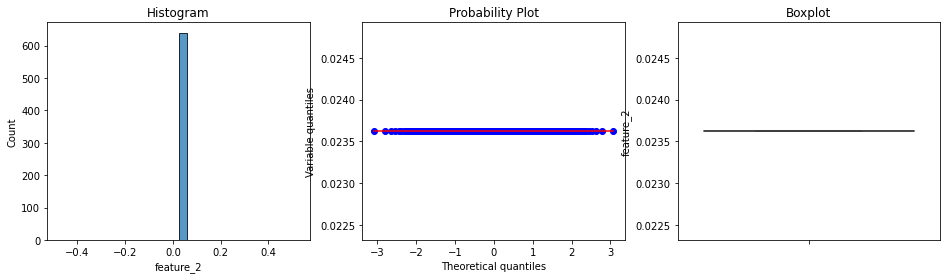

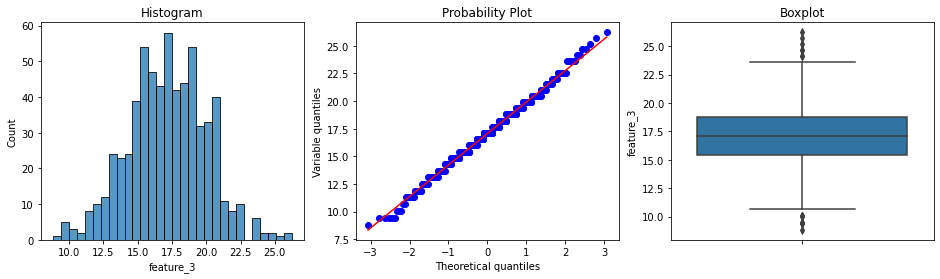

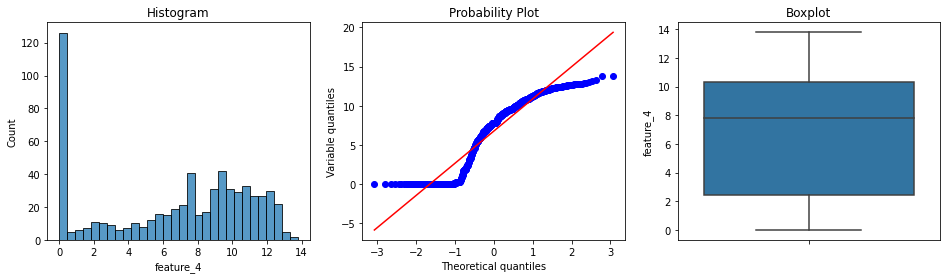

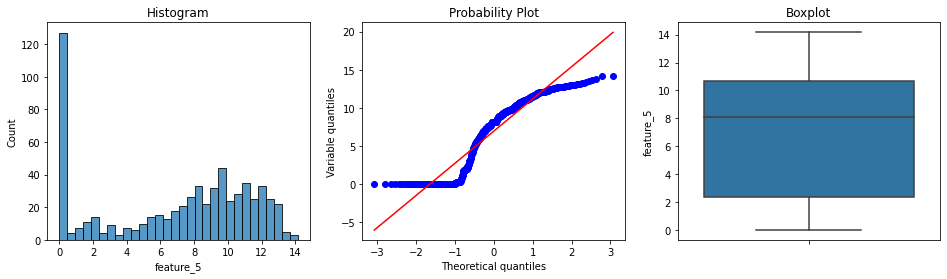

...

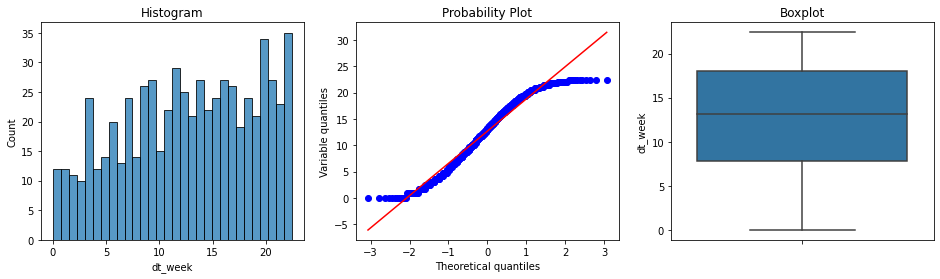

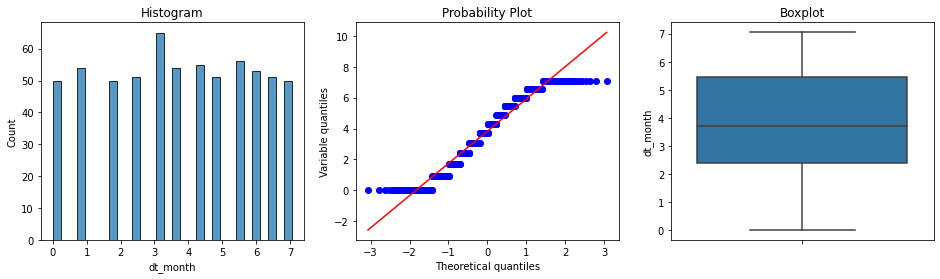

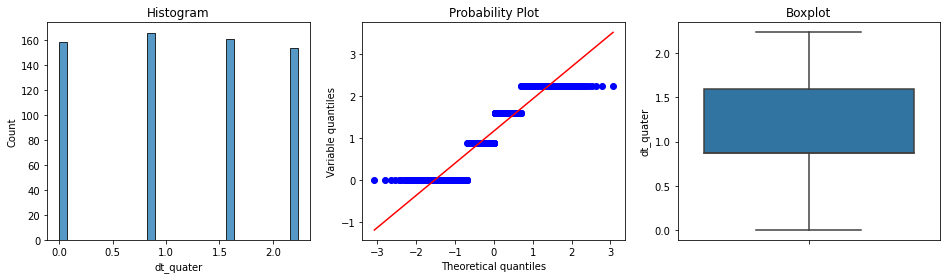

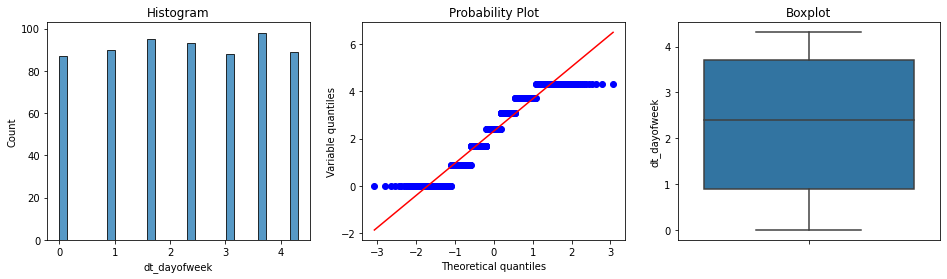

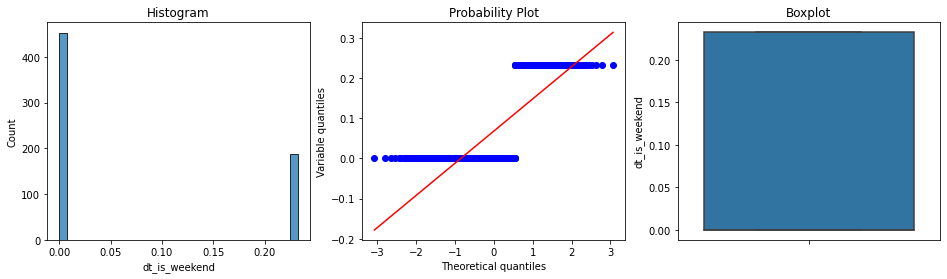

In [33]:
diagnostic_plots(X_train[train_vars])

In [34]:
windsoriser = Winsorizer(
    capping_method='gaussian', # choose iqr for IQR rule boundaries or gaussian for mean and std
    tail='both', # cap left, right or both tails 
    fold=3,
    variables=train_vars
)

windsoriser.fit(X_train[train_vars])

X_train[train_vars] = windsoriser.transform(X_train[train_vars])
X_test[train_vars] = windsoriser.transform(X_test[train_vars])

In [35]:
windsoriser.variables_

['feature_1',
 'feature_2',
 'feature_3',
 'feature_4',
 'feature_5',
 'feature_6',
 'feature_7',
 'feature_8',
 'feature_9',
 'feature_10',
 'feature_11',
 'feature_12',
 'feature_13',
 'feature_14',
 'feature_15',
 'feature_16',
 'feature_17',
 'feature_18',
 'feature_19',
 'feature_20',
 'feature_21',
 'feature_22',
 'feature_23',
 'feature_24',
 'feature_25',
 'feature_26',
 'feature_27',
 'feature_28',
 'feature_29',
 'feature_30',
 'feature_31',
 'feature_32',
 'feature_33',
 'feature_34',
 'feature_35',
 'feature_36',
 'feature_37',
 'feature_38',
 'feature_39',
 'feature_40',
 'feature_41',
 'feature_42',
 'feature_43',
 'feature_44',
 'feature_45',
 'feature_46',
 'feature_47',
 'feature_48',
 'feature_49',
 'feature_50',
 'feature_51',
 'feature_52',
 'feature_53',
 'feature_54',
 'feature_55',
 'feature_56',
 'feature_57',
 'feature_58',
 'feature_59',
 'feature_60',
 'feature_61',
 'feature_62',
 'feature_63',
 'feature_64',
 'feature_65',
 'feature_66',
 'feature_67',
 'fe

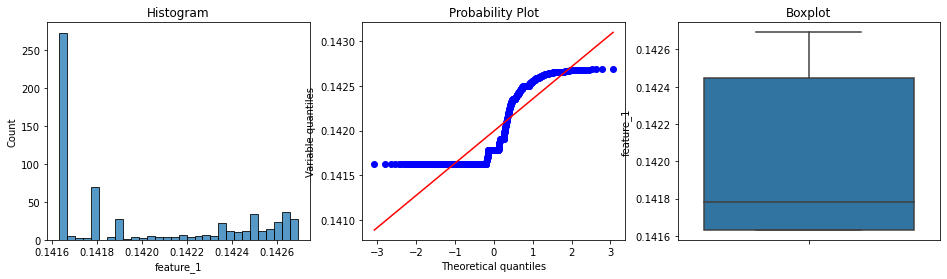

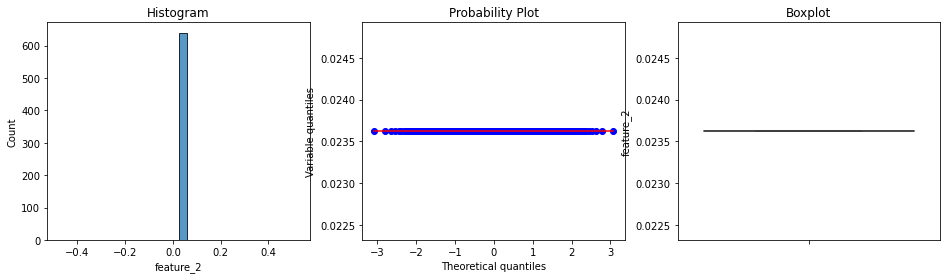

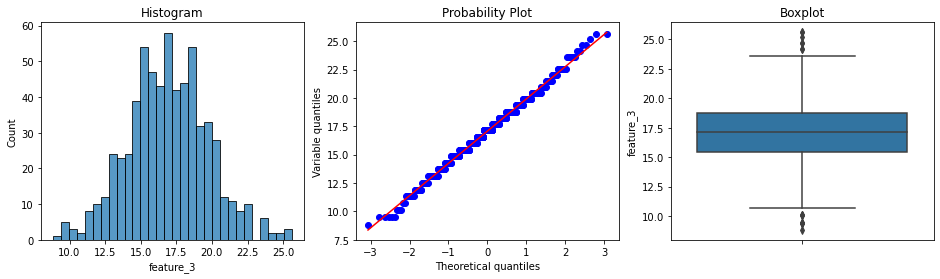

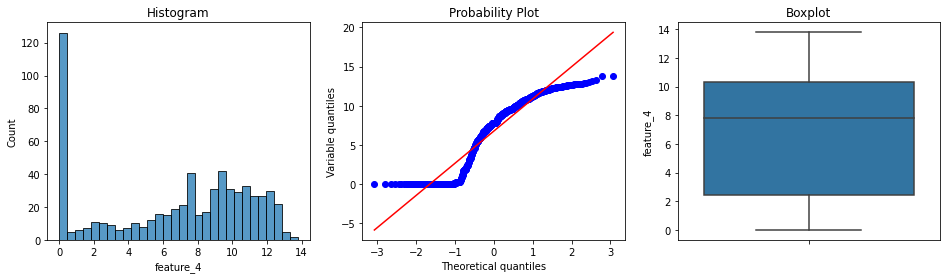

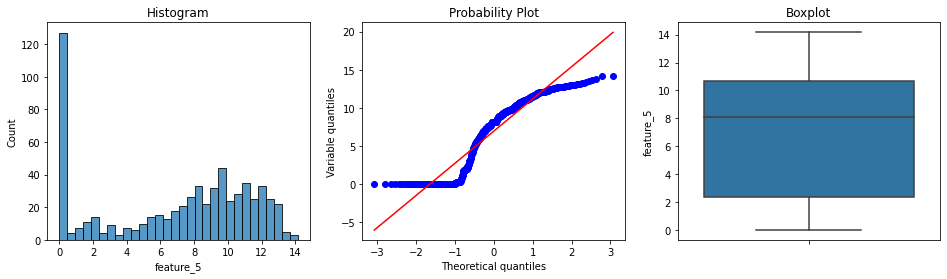

...

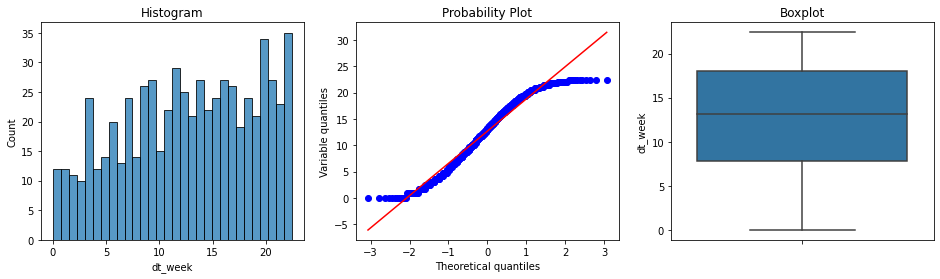

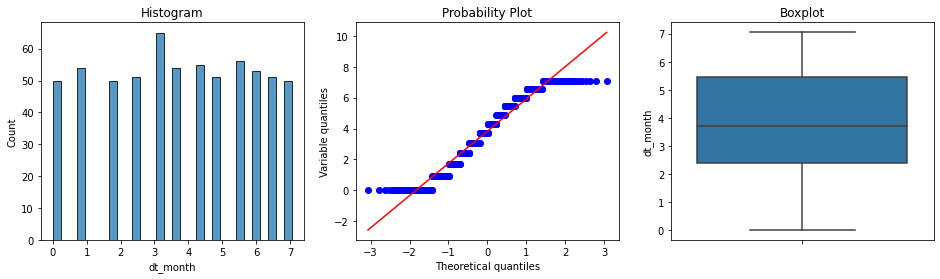

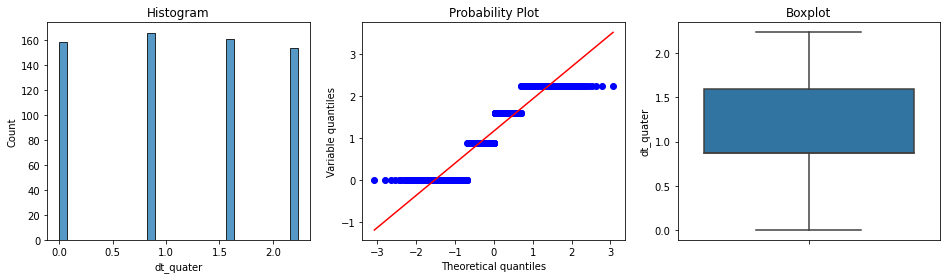

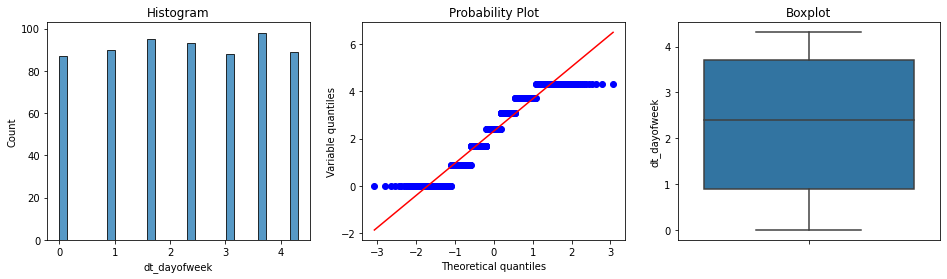

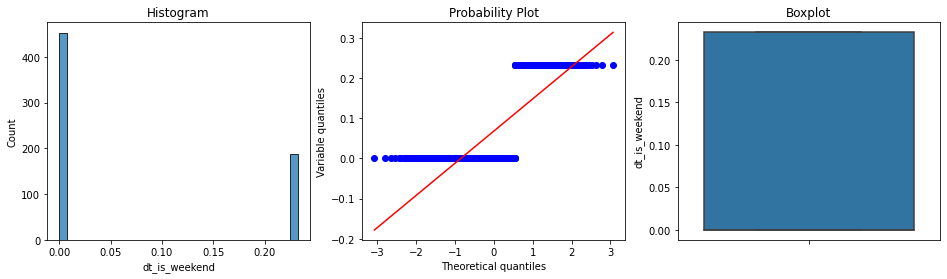

In [36]:
diagnostic_plots(X_train)

In [37]:
# Inspecting the caps left tail
windsoriser.left_tail_caps_

{'feature_1': 0.14077480805598355,
 'feature_2': 0.02362291681072616,
 'feature_3': 8.544440425850583,
 'feature_4': -6.219412219713023,
 'feature_5': -6.406254886517229,
 'feature_6': 4.382018682232248,
 'feature_7': 0.2433880110681259,
 'feature_8': -5.986397059844779,
 'feature_9': 0.11539265632684235,
 'feature_10': -0.36051023209951993,
 'feature_11': 0.09627996585298464,
 'feature_12': -5.10218678975288,
 'feature_13': 0.09627996585298464,
 'feature_14': 0.024519741256758754,
 'feature_15': 0.1027585649633044,
 'feature_16': -0.36678939817381906,
 'feature_17': 0.05663083839222059,
 'feature_18': 0.09058541680276742,
 'feature_19': 0.12111831753825346,
 'feature_20': 0.06228000460848783,
 'feature_21': 0.010142637156888951,
 'feature_22': 0.09627996585298464,
 'feature_23': -35.7255944770192,
 'feature_24': 0.11000496091541194,
 'feature_25': 0.01810526090938112,
 'feature_26': 12.963766394731149,
 'feature_27': 0.119739016044778,
 'feature_28': 0.09627996585298464,
 'feature_29'

In [38]:
# Inspecting the caps right tail
windsoriser.right_tail_caps_

{'feature_1': 0.1432154110696143,
 'feature_2': 0.023622916810726785,
 'feature_3': 25.59586649266936,
 'feature_4': 19.757757443257617,
 'feature_5': 20.323383661094713,
 'feature_6': 11.405884870848586,
 'feature_7': 1.257297901134741,
 'feature_8': 19.480500713448162,
 'feature_9': 0.11539265632685113,
 'feature_10': 2.844806607409634,
 'feature_11': 0.09627996585299038,
 'feature_12': 24.946656381781892,
 'feature_13': 0.09627996585299038,
 'feature_14': 0.02451974125675888,
 'feature_15': 0.10305696787697619,
 'feature_16': 2.845885696945242,
 'feature_17': 0.05663083839222109,
 'feature_18': 0.09068958900925976,
 'feature_19': 0.1221590097092377,
 'feature_20': 0.062280004608490536,
 'feature_21': 0.010142637156889399,
 'feature_22': 0.09627996585299038,
 'feature_23': 194.64623424688355,
 'feature_24': 0.11050930921532141,
 'feature_25': 0.018105260909382057,
 'feature_26': 22.484284969939754,
 'feature_27': 0.12066743348273161,
 'feature_28': 0.09627996585299038,
 'feature_29':

#### Feature Scaling
Finally Feature scaling Using standardization (centering at one)
Feature Engine library does not have feature scaling methods so we will be using sklearn with FE engine

In [39]:
# from sklearn.preprocessing import StandardScaler
# from feature_engine.wrappers import SklearnTransformerWrapper

# # set up the wrapper with the StandardScaler
# scaler = SklearnTransformerWrapper(
#     transformer = StandardScaler(),
#     variables = train_vars
# )

# # fit the wrapper + StandardScaler
# scaler.fit(X_train)

# # transform the data
# X_train = scaler.transform(X_train)
# X_test = scaler.transform(X_test)

# X_train[train_vars] = scaler.transform(X_train[train_vars]
# X_test[train_vars] = scaler.transform(X_test[train_vars])

In [40]:
# MinMax Scalar Option
from sklearn.preprocessing import MinMaxScaler
from feature_engine.wrappers import SklearnTransformerWrapper

scaler = SklearnTransformerWrapper(
    transformer = MinMaxScaler(),
    variables = train_vars
)

# fit the wrapper + StandardScaler
scaler.fit(X_train[train_vars])

X_train[train_vars] = scaler.transform(X_train[train_vars])
X_test[train_vars] = scaler.transform(X_test[train_vars])

In [41]:
X_train.head()

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,feature_80,feature_81,feature_82,feature_83,feature_84,feature_85,feature_86,feature_87,feature_88,feature_89,feature_90,feature_91,feature_92,feature_93,feature_94,feature_95,feature_96,feature_97,feature_98,feature_99,dt_day,dt_week,dt_month,dt_quater,dt_dayofweek,dt_is_weekend
682,0.067198,0.0,0.184243,0.775767,0.423007,0.573547,0.427677,0.850219,1.0,0.267449,0.0,0.289964,0.0,0.0,0.842027,0.911255,0.0,0.989811,0.967313,0.0,0.0,0.0,0.603956,0.000000,0.0,0.487005,0.994984,0.0,0.0,0.494655,0.325933,0.641448,0.698840,0.503000,0.0,0.797572,0.963562,0.986169,0.994923,0.565959,0.0,0.0,0.382719,0.339842,0.599828,0.754210,0.341121,0.0,0.476724,0.733901,0.869033,0.538954,0.819362,0.675694,0.0,0.791464,0.0,0.0,0.000000,0.984707,0.653034,0.0,0.977110,0.573417,0.0,0.132991,0.0,0.0,0.541870,0.000000,0.0,0.939440,0.0,0.639139,0.0,0.161857,0.0,0.616529,0.0,0.0,0.153375,0.0,0.393278,0.597378,0.000000,0.536407,0.671678,0.604271,0.0,0.0,0.620381,0.627438,0.930678,0.946400,0.864346,0.000000,0.435384,0.504862,0.608966,0.536197,0.743824,0.773463,0.713906,0.209409,0.0
527,0.000000,0.0,0.528253,0.078860,0.683715,0.642069,0.578407,0.000000,0.0,0.458794,0.0,0.053419,0.0,0.0,0.000000,0.562109,0.0,0.000000,0.967313,0.0,0.0,0.0,0.419173,0.000000,0.0,0.619364,0.000000,0.0,0.0,0.715562,0.891222,0.000000,0.800045,0.678329,0.0,0.141669,0.483041,0.000000,0.000000,0.674226,0.0,0.0,0.000000,0.191848,0.296387,0.528200,0.677880,0.0,0.176545,0.538878,0.569763,0.516607,0.656201,0.461674,0.0,0.489142,0.0,0.0,0.174554,0.000000,0.243191,0.0,0.000000,0.427629,0.0,0.000000,0.0,0.0,0.526531,0.000000,0.0,0.507876,0.0,0.106081,0.0,0.412802,0.0,0.671823,0.0,0.0,0.000000,0.0,0.545501,0.217434,0.000000,0.550335,0.625405,0.703798,0.0,0.0,0.455231,0.762153,0.131403,0.270730,0.546539,0.000000,0.507785,0.503940,0.410364,0.925625,0.806760,0.850955,1.000000,0.712449,0.0
577,0.768630,0.0,1.000000,0.696993,0.942213,0.538285,0.292054,0.134838,0.0,0.801047,0.0,0.947491,0.0,0.0,0.000000,0.297886,0.0,0.000000,0.000000,0.0,0.0,0.0,0.656804,0.755544,0.0,0.597656,0.417378,0.0,0.0,0.585860,0.815020,0.849195,0.825145,0.283072,0.0,0.651812,0.422315,0.000000,0.000000,0.449352,0.0,0.0,0.865990,0.398366,0.296387,0.694916,0.413661,0.0,0.635815,0.931197,0.905621,0.361092,0.378111,0.439693,0.0,0.020661,0.0,0.0,0.792650,0.000000,0.353762,0.0,0.309222,0.427629,0.0,0.906681,0.0,0.0,0.698363,0.844607,0.0,0.000000,0.0,0.598866,0.0,0.785801,0.0,0.676270,0.0,0.0,0.968168,0.0,0.051183,0.280420,0.876385,0.159668,0.227251,0.233385,0.0,0.0,0.361521,0.561226,0.655474,0.280586,0.453956,0.947434,0.256365,0.414563,0.497017,0.741377,0.927492,0.926389,1.000000,0.209409,0.0
367,0.726086,0.0,0.594197,0.496857,0.535721,0.740401,0.463661,0.000000,0.0,0.218730,0.0,0.710175,0.0,0.0,0.565718,0.669218,0.0,0.000000,0.967313,0.0,0.0,0.0,0.144151,0.000000,0.0,0.640939,0.000000,0.0,0.0,0.582764,0.586632,0.682801,0.647267,0.702365,0.0,0.000000,0.682096,0.000000,0.162522,0.621000,0.0,0.0,0.516540,0.547774,0.915181,0.690579,0.579071,0.0,0.449576,0.550909,0.468826,0.449759,0.574894,0.727457,0.0,0.759734,0.0,0.0,0.708987,0.000000,0.796264,0.0,0.869111,0.573417,0.0,0.564825,0.0,0.0,0.918

In [42]:
scaler.variables_

['feature_1',
 'feature_2',
 'feature_3',
 'feature_4',
 'feature_5',
 'feature_6',
 'feature_7',
 'feature_8',
 'feature_9',
 'feature_10',
 'feature_11',
 'feature_12',
 'feature_13',
 'feature_14',
 'feature_15',
 'feature_16',
 'feature_17',
 'feature_18',
 'feature_19',
 'feature_20',
 'feature_21',
 'feature_22',
 'feature_23',
 'feature_24',
 'feature_25',
 'feature_26',
 'feature_27',
 'feature_28',
 'feature_29',
 'feature_30',
 'feature_31',
 'feature_32',
 'feature_33',
 'feature_34',
 'feature_35',
 'feature_36',
 'feature_37',
 'feature_38',
 'feature_39',
 'feature_40',
 'feature_41',
 'feature_42',
 'feature_43',
 'feature_44',
 'feature_45',
 'feature_46',
 'feature_47',
 'feature_48',
 'feature_49',
 'feature_50',
 'feature_51',
 'feature_52',
 'feature_53',
 'feature_54',
 'feature_55',
 'feature_56',
 'feature_57',
 'feature_58',
 'feature_59',
 'feature_60',
 'feature_61',
 'feature_62',
 'feature_63',
 'feature_64',
 'feature_65',
 'feature_66',
 'feature_67',
 'fe

In [43]:
scaler.get_params()

{'transformer__clip': False,
 'transformer__copy': True,
 'transformer__feature_range': (0, 1),
 'transformer': MinMaxScaler(),
 'variables': ['feature_1',
  'feature_2',
  'feature_3',
  'feature_4',
  'feature_5',
  'feature_6',
  'feature_7',
  'feature_8',
  'feature_9',
  'feature_10',
  'feature_11',
  'feature_12',
  'feature_13',
  'feature_14',
  'feature_15',
  'feature_16',
  'feature_17',
  'feature_18',
  'feature_19',
  'feature_20',
  'feature_21',
  'feature_22',
  'feature_23',
  'feature_24',
  'feature_25',
  'feature_26',
  'feature_27',
  'feature_28',
  'feature_29',
  'feature_30',
  'feature_31',
  'feature_32',
  'feature_33',
  'feature_34',
  'feature_35',
  'feature_36',
  'feature_37',
  'feature_38',
  'feature_39',
  'feature_40',
  'feature_41',
  'feature_42',
  'feature_43',
  'feature_44',
  'feature_45',
  'feature_46',
  'feature_47',
  'feature_48',
  'feature_49',
  'feature_50',
  'feature_51',
  'feature_52',
  'feature_53',
  'feature_54',
  'f

#### Save Data

In [44]:
X_train.head()

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,feature_80,feature_81,feature_82,feature_83,feature_84,feature_85,feature_86,feature_87,feature_88,feature_89,feature_90,feature_91,feature_92,feature_93,feature_94,feature_95,feature_96,feature_97,feature_98,feature_99,dt_day,dt_week,dt_month,dt_quater,dt_dayofweek,dt_is_weekend
682,0.067198,0.0,0.184243,0.775767,0.423007,0.573547,0.427677,0.850219,1.0,0.267449,0.0,0.289964,0.0,0.0,0.842027,0.911255,0.0,0.989811,0.967313,0.0,0.0,0.0,0.603956,0.000000,0.0,0.487005,0.994984,0.0,0.0,0.494655,0.325933,0.641448,0.698840,0.503000,0.0,0.797572,0.963562,0.986169,0.994923,0.565959,0.0,0.0,0.382719,0.339842,0.599828,0.754210,0.341121,0.0,0.476724,0.733901,0.869033,0.538954,0.819362,0.675694,0.0,0.791464,0.0,0.0,0.000000,0.984707,0.653034,0.0,0.977110,0.573417,0.0,0.132991,0.0,0.0,0.541870,0.000000,0.0,0.939440,0.0,0.639139,0.0,0.161857,0.0,0.616529,0.0,0.0,0.153375,0.0,0.393278,0.597378,0.000000,0.536407,0.671678,0.604271,0.0,0.0,0.620381,0.627438,0.930678,0.946400,0.864346,0.000000,0.435384,0.504862,0.608966,0.536197,0.743824,0.773463,0.713906,0.209409,0.0
527,0.000000,0.0,0.528253,0.078860,0.683715,0.642069,0.578407,0.000000,0.0,0.458794,0.0,0.053419,0.0,0.0,0.000000,0.562109,0.0,0.000000,0.967313,0.0,0.0,0.0,0.419173,0.000000,0.0,0.619364,0.000000,0.0,0.0,0.715562,0.891222,0.000000,0.800045,0.678329,0.0,0.141669,0.483041,0.000000,0.000000,0.674226,0.0,0.0,0.000000,0.191848,0.296387,0.528200,0.677880,0.0,0.176545,0.538878,0.569763,0.516607,0.656201,0.461674,0.0,0.489142,0.0,0.0,0.174554,0.000000,0.243191,0.0,0.000000,0.427629,0.0,0.000000,0.0,0.0,0.526531,0.000000,0.0,0.507876,0.0,0.106081,0.0,0.412802,0.0,0.671823,0.0,0.0,0.000000,0.0,0.545501,0.217434,0.000000,0.550335,0.625405,0.703798,0.0,0.0,0.455231,0.762153,0.131403,0.270730,0.546539,0.000000,0.507785,0.503940,0.410364,0.925625,0.806760,0.850955,1.000000,0.712449,0.0
577,0.768630,0.0,1.000000,0.696993,0.942213,0.538285,0.292054,0.134838,0.0,0.801047,0.0,0.947491,0.0,0.0,0.000000,0.297886,0.0,0.000000,0.000000,0.0,0.0,0.0,0.656804,0.755544,0.0,0.597656,0.417378,0.0,0.0,0.585860,0.815020,0.849195,0.825145,0.283072,0.0,0.651812,0.422315,0.000000,0.000000,0.449352,0.0,0.0,0.865990,0.398366,0.296387,0.694916,0.413661,0.0,0.635815,0.931197,0.905621,0.361092,0.378111,0.439693,0.0,0.020661,0.0,0.0,0.792650,0.000000,0.353762,0.0,0.309222,0.427629,0.0,0.906681,0.0,0.0,0.698363,0.844607,0.0,0.000000,0.0,0.598866,0.0,0.785801,0.0,0.676270,0.0,0.0,0.968168,0.0,0.051183,0.280420,0.876385,0.159668,0.227251,0.233385,0.0,0.0,0.361521,0.561226,0.655474,0.280586,0.453956,0.947434,0.256365,0.414563,0.497017,0.741377,0.927492,0.926389,1.000000,0.209409,0.0
367,0.726086,0.0,0.594197,0.496857,0.535721,0.740401,0.463661,0.000000,0.0,0.218730,0.0,0.710175,0.0,0.0,0.565718,0.669218,0.0,0.000000,0.967313,0.0,0.0,0.0,0.144151,0.000000,0.0,0.640939,0.000000,0.0,0.0,0.582764,0.586632,0.682801,0.647267,0.702365,0.0,0.000000,0.682096,0.000000,0.162522,0.621000,0.0,0.0,0.516540,0.547774,0.915181,0.690579,0.579071,0.0,0.449576,0.550909,0.468826,0.449759,0.574894,0.727457,0.0,0.759734,0.0,0.0,0.708987,0.000000,0.796264,0.0,0.869111,0.573417,0.0,0.564825,0.0,0.0,0.918

In [45]:
X_test.head()

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,feature_80,feature_81,feature_82,feature_83,feature_84,feature_85,feature_86,feature_87,feature_88,feature_89,feature_90,feature_91,feature_92,feature_93,feature_94,feature_95,feature_96,feature_97,feature_98,feature_99,dt_day,dt_week,dt_month,dt_quater,dt_dayofweek,dt_is_weekend
648,0.982976,0.0,0.528253,0.000000,0.444038,0.349970,0.342179,0.892578,1.0,0.785742,0.0,0.969525,0.0,0.0,0.862432,0.547128,0.0,0.000000,0.0,0.0,0.0,0.0,0.471203,0.978624,0.0,0.026473,0.000000,0.0,0.0,0.404078,0.919003,0.799931,0.441915,0.844913,0.0,0.847348,0.588403,0.000000,0.162522,0.565959,0.0,0.0,0.777344,0.302804,0.957840,0.483169,0.178293,0.0,0.151056,0.293831,0.137062,0.163706,0.201253,0.699546,0.0,0.797728,0.0,0.0,0.980673,0.161902,0.592431,0.0,0.000000,0.808832,0.0,0.862503,0.0,0.0,0.835227,0.976064,0.0,0.000000,0.0,0.276516,0.0,0.520300,0.0,0.442060,0.0,0.0,0.662172,0.0,0.296681,0.873962,0.978210,0.497875,0.625405,0.521834,0.0,0.0,0.449241,0.702851,0.336011,0.896043,0.319285,0.978325,0.531407,0.596686,0.133429,0.900282,0.237419,0.340662,0.713906,0.391281,0.0
711,0.940031,0.0,0.594197,0.730325,0.609993,0.037314,0.641897,0.000000,1.0,0.808949,0.0,0.755826,0.0,0.0,0.000000,0.392616,0.0,0.000000,0.0,0.0,0.0,0.0,0.534932,0.234160,0.0,0.553828,0.997682,0.0,0.0,0.383048,0.656566,0.729494,0.692072,0.806276,0.0,0.141669,0.679995,0.000000,0.120764,0.251490,0.0,0.0,0.851068,0.536535,0.599828,0.030118,0.453858,0.0,0.410442,0.720226,0.684113,0.651147,0.304927,0.694787,0.0,0.452239,0.0,0.0,0.361850,0.000000,0.585829,0.0,0.967116,0.427629,0.0,0.820136,0.0,0.0,0.678151,0.937331,0.0,0.415588,0.0,0.079648,0.0,0.538578,0.0,0.057705,0.0,0.0,0.909735,0.0,0.649481,0.430207,0.990274,0.105058,0.503600,0.414881,0.0,0.0,0.519595,0.363276,0.943731,0.286711,0.388384,0.998529,0.507785,0.376813,0.380917,0.925625,0.662244,0.693617,0.390619,0.391281,0.0
404,0.872333,0.0,0.461474,0.528127,0.488843,0.309446,0.578785,0.526933,0.0,0.950951,0.0,0.647281,0.0,0.0,0.000000,0.378254,0.0,0.533533,0.0,0.0,0.0,0.0,0.476163,0.000000,0.0,0.253653,0.971800,0.0,0.0,0.398328,0.484871,0.781049,0.818906,0.447912,0.0,0.546492,0.444750,0.986169,0.866177,0.387043,0.0,0.0,0.755123,0.369776,0.502972,0.488480,0.573049,0.0,0.395812,0.617006,0.562288,0.696231,0.260497,0.329841,0.0,0.659952,0.0,0.0,0.462695,0.982468,0.509377,0.0,0.967116,0.000000,0.0,0.479486,0.0,0.0,0.538055,0.976064,0.0,0.863253,0.0,0.198916,0.0,0.519138,0.0,0.526917,0.0,0.0,0.872774,0.0,0.500562,0.076692,0.970436,0.638087,0.503600,0.325853,0.0,0.0,0.388706,0.267703,0.930583,0.603542,0.485544,0.963993,0.690331,0.432129,0.553475,0.768769,0.467663,0.239223,0.390619,0.000000,0.0
79,0.260687,0.0,0.594197,0.000000,0.319577,0.952948,0.639349,0.538446,0.0,0.486680,0.0,0.280154,0.0,0.0,0.000000,0.708689,0.0,0.000000,0.0,0.0,0.0,0.0,0.716555,0.777375,0.0,0.372512,0.000000,0.0,0.0,0.692023,0.788771,0.488444,0.000000,0.869941,0.0,0.010058,0.586690,0.000000,0.162522,0.508851,0.0,0.0,0.345732,0.653958,0.646961,0.787912,0.463129,0.0,0.554419,0.124511,0.000000,0.383207,0.533121,0.486330,0.0,0.020661,0.0,0.0,0.211202,0.000000,0.653143,0.0,0.000000,0.248096,0.0,0.358492,0.0,0.0,0.096891,0.000000,0.0,0.00

In [46]:
X_test.isnull().sum()

feature_1        0
feature_2        0
feature_3        0
feature_4        0
feature_5        0
                ..
dt_week          0
dt_month         0
dt_quater        0
dt_dayofweek     0
dt_is_weekend    0
Length: 105, dtype: int64

In [47]:
# Data stored to be used in the feature selection phase
X_train.to_csv(r'./../Dataset/2-engineered/xtrain.csv', index=False)
X_test.to_csv(r'./../Dataset/2-engineered/xtest.csv', index=False)

y_train.to_csv(r'./../Dataset/2-engineered/ytrain.csv', index=False)
y_test.to_csv(r'./../Dataset/2-engineered/ytest.csv', index=False)

In [48]:
# storing feature engineering variables for mapping in config
import joblib

mappers = {
    'ordinal_enc_variables_': ordinal_enc.variables_,
    'ordinal_enc_encoder_dict_': ordinal_enc.encoder_dict_,
    'imputer_variables_': imputer.variables_,
    'imputer_imputer_dict_': imputer.imputer_dict_,
    'yjt_variables_': yjt.variables_,
    'yjt_lambda_dict_': yjt.lambda_dict_,
    'windsoriser_variables_': windsoriser.variables_,
    'windsoriser_tail': windsoriser.tail,
    'windsoriser_left_tail_caps_': windsoriser.left_tail_caps_,
    'windsoriser_right_tail_caps_': windsoriser.right_tail_caps_,
    'scaler_variables_': scaler.variables_,
    'scaler': scaler,
}

for obj_name, obj in mappers.items():
    file_dir = f'./config/{obj_name}.joblib'
    joblib.dump(obj, file_dir)

In [68]:
# # load dataset
# data = pd.read_csv(r'./../Dataset/1-raw/assessment_test_data.csv')
# X_train, X_test, y_train, y_test = train_test_split(
#     data.drop(['date', 'units_sold'], axis=1), 
#     data['units_sold'],
#     test_size=0.15,
#     random_state=0
# )
# X_train.shape, X_test.shape
# # Creating train test splits to prevent overfitting
# X_train.to_csv(r'./../Dataset/6-prod/xtrain.csv', index=False)
# X_test.to_csv(r'./../Dataset/6-prod/xtest.csv', index=False)